In [3]:
# 23년도 분기별로 구분하는 과정

import pandas as pd
df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2023.csv", encoding="utf-8-sig")
df
# 분기별로 그룹화 과정
groups = df.groupby('기준_년분기_코드')
groups


# 2023년도 에 2024년도 데이터도 있어서 분류하는 과정
for code, group in groups:
    if code == 20241:
        filename = f"C:/Users/yjk23/sf6-data/data_csv/main_2024.csv" 
        group.to_csv(filename, index=False, encoding="utf-8")

quarters = [20231, 20232, 20233, 20234]

# 다시 그룹화 하여 저장
combined_df = pd.concat([group for code, group in groups if code in quarters])
combined_df
# 결합된 데이터를 새로운 CSV 파일로 저장
# combined_df.to_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2023.csv", index=False, encoding="utf-8")

C:\Users\yjk23\AppData\Local\Temp\ipykernel_23404\329553265.py:2: DtypeWarning: Columns (56) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2023.csv", encoding="utf-8-sig")


,기준_년분기_코드,상권_구분_코드,상권_구분_코드_명,상권_코드,상권배후지_코드_명,서비스_업종_코드,서비스_업종_코드_명,당월_매출_금액,당월_매출_건수,주중_매출_금액,...,남성_매출_건수,여성_매출_건수,연령대_10_매출_건수,연령대_20_매출_건수,연령대_30_매출_건수,연령대_40_매출_건수,연령대_50_매출_건수,연령대_60_이상_매출_건수,업종_전처리,서울_구구분
0,20231,A,골목상권,종로구,이북5도청사,CS100001,한식음식점,880008619,19572,590910801,...,11211,5672,100,849,1860,2709,4398,6968,요식업,3110001
1,20231,A,골목상권,종로구,이북5도청사,CS100008,분식전문점,153627808,14036,100927021,...,7273,5719,110,892,1724,3235,4320,2710,요식업,3110001
2,20231,A,골목상권,종로구,이북5도청사,CS100009,호프-간이주점,259016624,2943,208949005,...,1642,1114,23,434,516,453,859,475,요식업,3110001
3,20231,A,골목상권,종로구,이북5도청사,CS100010,커피-음료,2849056,344,2683962,...,148,196,19,23,80,102,91,29,요식업,3110001
4,20231,A,골목상권,종로구,이북5도청사,CS200001,일반교습학원,47135947,136,47135947,...,96,40,0,0,8,120,8,0,서비스업,3110001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147954,20234,A,골목상권,강동구,고덕동성당,CS300003,컴퓨터및주변장치판매,2068965,31,2068965,...,31,0,0,0,0,10,10,11,판매업,강동구
147955,20234,A,골목상권,강동구,고덕동성당,CS300007,육류판매,476165690,15105,323027344,...,6125,8980,6,299,2028,3894,3933,4945,판매업,강동구
147956,20234,A,골목상권,강동구,고덕동성당,CS300009,청과상,558000000,29044,444780645,...,9878,18548,26,766,3490,5592,6505,12047,판매업,강동구
147957,20234,A,골목상권,강동구,고덕동성당,CS300010,반찬가게,24000000,3213,15962838,...,1514,1699,27,242,738,895,634,677,판매업,강동구


In [8]:
# 2022년 서비스_업종_코드 대분류 작업
import pandas as pd
# 데이터 읽기
df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2021.csv", encoding="utf-8-sig")

# 업종_전처리 열 초기화
df['업종_전처리'] = None

# 업종 코드에 따른 전처리 작업
for index, code in enumerate(df['서비스_업종_코드']):
    if 'CS1' in code:
        df.loc[index, '업종_전처리'] = '요식업'
    elif 'CS2' in code:
        df.loc[index, '업종_전처리'] = '서비스업'
    elif 'CS3' in code:
        df.loc[index, '업종_전처리'] = '판매업'

# 결과를 CSV 파일로 저장
df.to_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2021.csv", encoding="utf-8-sig", index=False)

# 결과 출력 (선택 사항, 주석 처리됨)
for quarter in quarters:
    print(f"{quarter}분기 총 매출 금액:", formatted_sales[quarter])

TypeError: unhashable type: 'list'

In [11]:
# 한 해의 업종별로 총매출 구하는 과정 아래에 19~23년도 전부다 구하는 로직있음
import pandas as pd

df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2019.csv", encoding="utf-8-sig", low_memory=False)
quarters = [20191, 20192, 20193, 20194]
cooks = ['요식업', '서비스업', '판매업']

sales_data = []

for quarter in quarters:
    for cook in cooks:
        # 분기 및 업종 필터링
        filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
        # 총 매출 금액 계산
        total_sales = filtered_df['당월_매출_금액'].sum()
        
        sales_data.append({
            '기준_년분기_코드': quarter,
            '업종': cook,
            '총 매출 금액': total_sales
        })

df1 = pd.DataFrame(sales_data)

print(df1)
# df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_job.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")

    기준_년분기_코드    업종         총 매출 금액
0       20191   요식업   6008555047787
1       20191  서비스업   4737147319034
2       20191   판매업  12939195472899
3       20192   요식업   6481667488743
4       20192  서비스업   4977837935842
5       20192   판매업  13226181792895
6       20193   요식업   6580376420742
7       20193  서비스업   5006864977886
8       20193   판매업  13400362563624
9       20194   요식업   7202289198367
10      20194  서비스업   5345261861572
11      20194   판매업  14254865074284
CSV 파일이 성공적으로 생성되었습니다.


In [70]:
import pandas as pd
# 분기별로 직무 총매출을 전처리하고 csv 하는과정임
years = [2019, 2020, 2021, 2022, 2023]
quarters = [
    [20191, 20192, 20193, 20194],
    [20201, 20202, 20203, 20204],
    [20211, 20212, 20213, 20214],
    [20221, 20222, 20223, 20224],
    [20231, 20232, 20233, 20234]
]
cooks = ['요식업', '서비스업', '판매업']

# 연도별 매출 데이터를 저장할 리스트
sales_data = []

# 각 년도에 대해 파일을 읽고, 각 분기별 매출을 계산
for i, year in enumerate(years):
    # 해당 년도의 CSV 파일 읽기
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" + f"{year}.csv", encoding="utf-8-sig", low_memory=False)
    
    # 현재 년도에 맞는 분기를 반복
    for quarter in quarters[i]:
        for cook in cooks:
            # 분기 및 업종 필터링
            filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
            # 총 매출 금액 계산
            total_sales = filtered_df['당월_매출_금액'].sum()
            
            # 결과를 리스트에 추가
            sales_data.append({
                '기준_년분기_코드': quarter,
                '업종': cook,
                '총 매출 금액': total_sales
            })

# 데이터프레임 생성
df1 = pd.DataFrame(sales_data)

# 결과 출력
print(df1)

# CSV 파일로 저장
df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_job.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")

    기준_년분기_코드    업종         총 매출 금액
0       20191   요식업   6008555047787
1       20191  서비스업   4737147319034
2       20191   판매업  12939195472899
3       20192   요식업   6481667488743
4       20192  서비스업   4977837935842
5       20192   판매업  13226181792895
6       20193   요식업   6580376420742
7       20193  서비스업   5006864977886
8       20193   판매업  13400362563624
9       20194   요식업   7202289198367
10      20194  서비스업   5345261861572
11      20194   판매업  14254865074284
12      20201   요식업   6126806278029
13      20201  서비스업   4739492759974
14      20201   판매업  13436182368443
15      20202   요식업   6714069815393
16      20202  서비스업   5048492573792
17      20202   판매업  14569892672764
18      20203   요식업   6483857401021
19      20203  서비스업   5068200607520
20      20203   판매업  14275653089711
21      20204   요식업   6067085417198
22      20204  서비스업   5022485787020
23      20204   판매업  14502114599268
24      20211   요식업   5544484616429
25      20211  서비스업   4981236335685
26      20211   판매업  1388634

In [ ]:
import pandas as pd
# 분기별로 직무 총매출을 전처리하고 csv 하는과정임
# 년도 및 분기 리스트
years = [2019, 2020, 2021, 2022, 2023]
quarters = [
    [20191, 20192, 20193, 20194],
    [20201, 20202, 20203, 20204],
    [20211, 20212, 20213, 20214],
    [20221, 20222, 20223, 20224],
    [20231, 20232, 20233, 20234]
]
cooks = ['요식업', '서비스업', '판매업']

# 연도별 매출 데이터를 저장할 리스트
sales_data = []

# 각 년도에 대해 파일을 읽고, 각 분기별 매출을 계산
for i, year in enumerate(years):
    # 해당 년도의 CSV 파일 읽기
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" + f"{year}.csv", encoding="utf-8-sig", low_memory=False)
    
    # 현재 년도에 맞는 분기를 반복
    for quarter in quarters[i]:
        for cook in cooks:
            # 분기 및 업종 필터링
            filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
            # 총 매출 금액 계산
            total_sales = filtered_df['당월_매출_금액'].sum()
            
            # 결과를 리스트에 추가
            sales_data.append({
                '기준_년분기_코드': quarter,
                '업종': cook,
                '총 매출 금액': total_sales
            })

# 데이터프레임 생성
df1 = pd.DataFrame(sales_data)

# 결과 출력
print(df1)

# CSV 파일로 저장
# df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_job.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")

In [5]:
import pandas as pd

# 전 년도 분기별로 총매출 구하고 csv 파일 만드는 과정
years = [2019, 2020, 2021, 2022, 2023]
quarters = [
    [20191, 20192, 20193, 20194],
    [20201, 20202, 20203, 20204],
    [20211, 20212, 20213, 20214],
    [20221, 20222, 20223, 20224],
    [20231, 20232, 20233, 20234]
]

# 연도별 매출 데이터를 저장할 리스트
sales_data = []

# 각 년도에 대해 파일을 읽고, 각 분기별 매출을 계산
for i, year in enumerate(years):
    # 해당 년도의 CSV 파일 읽기
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" + f"{year}.csv", encoding="utf-8-sig")
    
    # 각 분기별 매출 합계 계산
    for quarter in quarters[i]:
        # 분기 및 업종 필터링
        filtered_df = df[df['기준_년분기_코드'] == quarter]
        
        # 총 매출 금액 계산
        total_sales = filtered_df['당월_매출_금액'].sum()
        
        # 결과를 리스트에 추가
        sales_data.append({
            '기준_년분기_코드': quarter,
            '당월_매출_금액': total_sales
        })

# 데이터프레임 생성
result_df = pd.DataFrame(sales_data)

# CSV 파일로 저장
# result_df.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_sales.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")
result_df

CSV 파일이 성공적으로 생성되었습니다.


C:\Users\yjk23\AppData\Local\Temp\ipykernel_23404\3436774793.py:19: DtypeWarning: Columns (56) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" + f"{year}.csv", encoding="utf-8-sig")


,기준_년분기_코드,당월_매출_금액
0,20191,23684897839720
1,20192,24685687217480
2,20193,24987603962252
3,20194,26802416134223
4,20201,24302481406446
5,20202,26332455061949
6,20203,25827711098252
7,20204,25591685803486
8,20211,24412061232349
9,20212,26888725131001


In [71]:

# 지정 년도 분기별 총매출
import pandas as pd
df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2019.csv", encoding="utf-8-sig",low_memory=False)
df

# groups = df.groupby('상권_코드')
# 각 상권_코드 그룹을 별도의 CSV 파일로 저장
# for code, group in groups:
#     filename = f"C:/Users/yjk23/sf6-data/datas/{code}.csv"  # 파일 이름을 상권 코드로 설정
#     group.to_csv(filename, index=False, encoding="utf-8")

# 분기 리스트
# quarters = [20221, 20222, 20223, 20224]
quarters = [20191, 20192, 20193, 20194]
formatted_sales = {}

# 각 분기 총 매출 금액 계산
for quarter in quarters:
    filtered_df = df[df['기준_년분기_코드'] == quarter]
    # print(filtered_df)
    total_sales = filtered_df['당월_매출_금액'].sum()
    formatted_sales[quarter] = f"{total_sales:,.0f}"

# 결과 출력
for quarter in quarters:
    print(f"{quarter}분기 총 매출 금액:", formatted_sales[quarter])

20191분기 총 매출 금액: 23,684,897,839,720
20192분기 총 매출 금액: 24,685,687,217,480
20193분기 총 매출 금액: 24,987,603,962,252
20194분기 총 매출 금액: 26,802,416,134,223


In [6]:
# 2019~2023 년도를 분기마다 총매출을 구하고 csv 파일을 만드는 과정

import pandas as pd

# 년도 및 분기 리스트
year = [2019, 2020, 2021, 2022, 2023]
quarters = [[20191, 20192, 20193, 20194],
            [20201, 20202, 20203, 20204],
            [20211, 20212, 20213, 20214],
            [20221, 20222, 20223, 20224],
            [20231, 20232, 20233, 20234]]

# 연도별 매출 데이터를 저장할 딕셔너리
formatted_sales = {}

# 각 년도에 대해 파일을 읽고, 각 분기별 매출을 계산
for i, y in enumerate(year):
    # 해당 년도의 CSV 파일 읽기
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" +  f"{y}.csv", encoding="utf-8-sig")
    
    # 각 분기별 매출 합계 계산
    for quarter in quarters[i]:
        filtered_df = df[df['기준_년분기_코드'] == quarter]
        total_sales = filtered_df['당월_매출_금액'].sum()
        formatted_sales[quarter] = total_sales

# # 결과 출력
# for quarter in formatted_sales:
#     print(f"{quarter}분기 총 매출 금액:", formatted_sales[quarter])

data = []

# 결과를 리스트에 추가
for quarter in formatted_sales:
    data.append([quarter, formatted_sales[quarter]])

# 데이터프레임 생성
result_df = pd.DataFrame(data, columns=['기준_년분기_코드', '당월_매출_금액'])

# CSV 파일로 저장
# result_df.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_sales.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")
result_df

CSV 파일이 성공적으로 생성되었습니다.


C:\Users\yjk23\AppData\Local\Temp\ipykernel_23404\2034627014.py:19: DtypeWarning: Columns (56) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" +  f"{y}.csv", encoding="utf-8-sig")


,기준_년분기_코드,당월_매출_금액
0,20191,23684897839720
1,20192,24685687217480
2,20193,24987603962252
3,20194,26802416134223
4,20201,24302481406446
5,20202,26332455061949
6,20203,25827711098252
7,20204,25591685803486
8,20211,24412061232349
9,20212,26888725131001


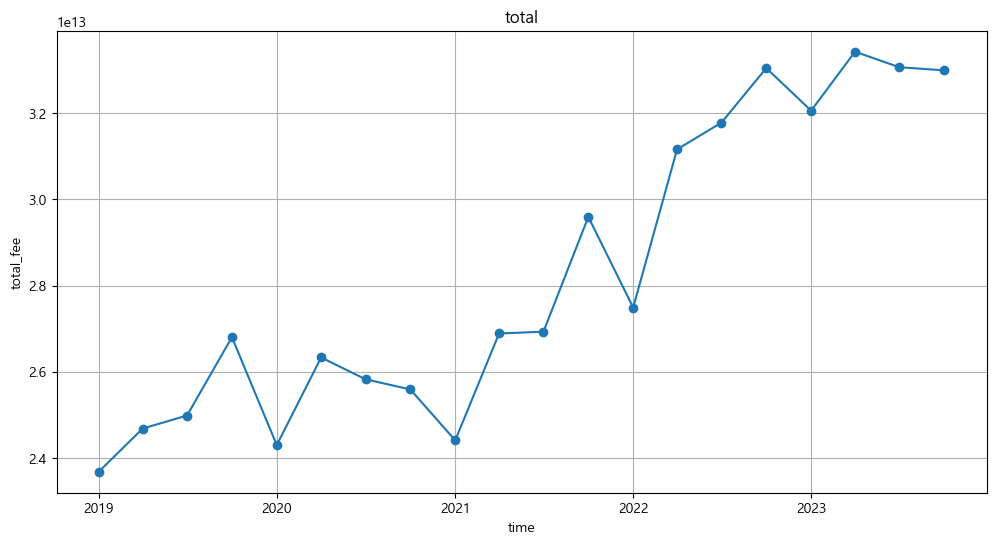

ADF Statistic: -0.49972814996279696
p-value: 0.8920695353833444
                               SARIMAX Results                                
Dep. Variable:                  총매출금액   No. Observations:                   20
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -559.923
Date:                Wed, 28 Aug 2024   AIC                           1125.846
Time:                        23:13:22   BIC                           1128.679
Sample:                    01-01-2019   HQIC                          1126.325
                         - 10-01-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9331      0.065    -14.395      0.000      -1.060      -0.806
ma.L1          0.9997      0.288      3.468      0.001       0.435 

C:\Users\yjk23\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
C:\Users\yjk23\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
C:\Users\yjk23\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)


In [46]:
# 2019 ~ 2023 년도 분기 별로 총매출을 뽑고 시각화 및 차분 과정
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
# 데이터 로드 (예시: 'data.csv' 파일에서)
data = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/all_year_sales.csv")
# 기준_년분기_코드 열을 datetime으로 변환
def convert_to_datetime(quarter_code):
    year = int(str(quarter_code)[:-1])  # 연도 추출
    quarter = int(str(quarter_code)[-1])  # 분기 추출
    month = (quarter - 1) * 3 + 1  # 분기를 월로 변환 (1, 4, 7, 10)
    return pd.Timestamp(year=year, month=month, day=1)
# 새로운 열 추가
data['기준_년분기_코드'] = data['기준_년분기_코드'].apply(convert_to_datetime)
# 분기별 총매출 계산
data['총매출금액'] = data['당월_매출_금액']  # 당월 매출 금액이 있는 열 이름을 사용하세요
quarterly_sales = data.groupby('기준_년분기_코드')['총매출금액'].sum().reset_index()
# 시계열 데이터로 설정
quarterly_sales.set_index('기준_년분기_코드', inplace=True)
# 시계열 데이터 시각화
plt.figure(figsize=(12, 6))
plt.plot(quarterly_sales, marker='o')
plt.title('total')
plt.xlabel('time')
plt.ylabel('total_fee')
plt.grid()
plt.show()
# ADF 검정으로 정상성 확인
adf_result = adfuller(quarterly_sales['총매출금액'])
print('ADF Statistic:', adf_result[0])
print('p-value:', adf_result[1])
# ARIMA 모델 적합
model = ARIMA(quarterly_sales['총매출금액'], order=(1, 1, 1))  # (p, d, q) 값은 데이터에 따라 조정 필요
model_fit = model.fit()
# 모델 요약
print(model_fit.summary())
# 예측
forecast = model_fit.forecast(steps=4)  # 다음 4분기 예측
print('다음 4분기 총매출 예측:', forecast)

In [9]:
import pandas as pd


n1 = [3110968,3110969,3110970,3110971,3110972,3110973,3110983,3110984,3110985,3110986,3110987,3111002,3110988,3110989,3110990,3110991,3110992,3110993,3110994,3110995,3110996,3110949,3110950,3110951,3110952,3110953,3110954,3110955,3110956,3110997,3110998,3110999,3111000,3111001,3110957,3110958,3110959,3110960,3110961,3110962,3110963,3110964,3110965,3110974,3110975,3110976,3110977,3110978,3110979,3110980,3110981,3110982,3110966,3110967]
gangnam = "강남구"
n2 = [3110254,3110255,3110233,3110234,3110235,3110236,3110237,3110238,3110239,3110243,3110244,3110245,3110246,3110247,3110248,3110249,3110250,3110240,3110241,3110242,3110251,3110252,3110253,3110277,3110278,3110272,3110273,3110256,3110257,3110258,3110259,3110260,3110261,3110262,3110263,3110264,3110265,3110266,3110267,3110268,3110269,3110270,3110271,3110274,3110275,3110276,3110279]
jungnang = "중랑구"
n3 = [3110038,3110039,3110057,3110040,3110041,3110042,3110043,3110044,3110045,3110046,3110047,3110048,3110049,3110053,3110054,3110055,3110056,3110050,3110051,3110052,3110591]
jung = "중구"
n4 = [3110008,3110009,3110010,3110017,3110018,3110019,3110020,3110001,3110002,3110003,3110004,3110035,3110011,3110012,3110013,3110014,3110015,3110016,3110005,3110006,3110007,3110037,3110021,3110022,3110023,3110024,3110025,3110026,3110027,3110028,3110029,3110030,3110031,3110032,3110033,3110034,3110036,3110531]
jongno = "종로구"
n5 = [3110480,3110481,3110455,3110456,3110457,3110483,3110484,3110470,3110471,3110491,3110492,3110447,3110448,3110472,3110473,3110449,3110485,3110486,3110487,3110458,3110459,3110460,3110461,3110450,3110474,3110451,3110488,3110489,3110490,3110475,3110476,3110462,3110463,3110464,3110443,3110452,3110444,3110445,3110446,3110477,3110478,3110453,3110454,3110479,3110482,3110468,3110469,3110465,3110466,3110467]
eunpyeong = "은평구"
n6 = [3110058,3110059,3110079,3110080,3110081,3110060,3110061,3110062,3110063,3110064,3110082,3110083,3110084,3110085,3110086,3110065,3110066,3110067,3110068,3110069,3110070,3110071,3110072,3110073,3110074,3110075,3110076,3110077,3110078,3110087,3110088,3110089,3110090,3110091,3110092,3110093,3110094,3110095,3110096,3110097,3110098,3110099]
yongsan = "용산구"
n7 = [3110780,3110781,3110782,3110783,3110803,3110804,3110805,3110806,3110756,3110757,3110758,3110807,3110774,3110775,3110776,3110790,3110791,3110792,3110793,3110808,3110809,3110815,3110816,3110759,3110760,3110761,3110762,3110794,3110795,3110796,3110797,3110777,3110763,3110764,3110813,3110814,3110798,3110765,3110766,3110767,3110799,3110800,3110801,3110802,3110778,3110779,3110784,3110785,3110768,3110817,3110769,3110770,3110771,3110772,3110773,3110786,3110787,3110788,3110789,3110810,3110811,3110812]
yeongdeungpo = "영등포구"
n8 = [3110593,3110594,3110595,3110592,3110608,3110609,3110610,3110623,3110624,3110625,3110626,3110612,3110613,3110614,3110615,3110616,3110596,3110597,3110598,3110599,3110627,3110628,3110600,3110601,3110602,3110603,3110611,3110617,3110618,3110619,3110604,3110605,3110606,3110607,3110620,3110621,3110622]
yangcheon = "양천구"
n9 = [3111026,3111027,3111025,3111037,3111017,3111018,3111041,3111042,3111028,3111029,3111030,3111003,3111004,3111005,3111006,3111019,3111020,3111031,3111032,3111007,3111008,3111043,3111044,3111009,3111010,3111011,3111012,3111013,3111045,3111046,3111047,3111021,3111022,3111023,3111033,3111034,3111024,3111014,3111015,3111016,3111038,3111039,3111035,3111036,3111040]
songpa = "송파구"
n10 = [3110221,3110320,3110321,3110322,3110323,3110280,3110281,3110282,3110283,3110284,3110285,3110286,3110287,3110288,3110289,3110290,3110298,3110299,3110300,3110301,3110302,3110303,3110304,3110305,3110306,3110307,3110308,3110309,3110291,3110292,3110293,3110294,3110295,3110296,3110297,3110310,3110311,3110312,3110313,3110314,3110315,3110316,3110317,3110318,3110319,3110324,3110325,3110326,3110327,3110328,3110329,3110330,3110331,3110332,3110333,3110334,3110335,3110336]
seongbuk = "성북구"
n11 = [3110110,3110111,3110100,3110101,3110102,3110103,3110104,3110108,3110109,3110129,3110130,3110131,3110132,3110136,3110105,3110106,3110107,3110112,3110113,3110114,3110133,3110134,3110135,3110115,3110116,3110117,3110118,3110119,3110120,3110121,3110122,3110123,3110124,3110125,3110126,3110127,3110128,3110137,3110138]
seongdong = "성동구"
n12 = [3110942,3110943,3110944,3110926,3110909,3110910,3110911,3110912,3110927,3110928,3110929,3110945,3110946,3110947,3110903,3110913,3110914,3110930,3110931,3110932,3110933,3110934,3110935,3110915,3110936,3110937,3110938,3110948,3110904,3110905,3110906,3110907,3110908,3110916,3110939,3110940,3110941,3110917,3110918,3110919,3110920,3110921,3110922,3110923,3110924,3110925]
seocho = "서초구"
n13 = [3110505,3110506,3110517,3110518,3110493,3110507,3110508,3110534,3110535,3110519,3110520,3110494,3110495,3110521,3110522,3110523,3110524,3110496,3110536,3110537,3110538,3110539,3110525,3110497,3110509,3110510,3110526,3110498,3110499,3110500,3110527,3110528,3110511,3110512,3110513,3110515,3110516,3110529,3110501,3110502,3110503,3110504,3110532,3110533,3110530,3110514]
seodaemun = "서대문구"
n14 = [3110566,3110542,3110543,3110544,3110545,3110584,3110553,3110554,3110555,3110580,3110581,3110582,3110583,3110567,3110568,3110585,3110586,3110587,3110560,3110561,3110546,3110547,3110569,3110570,3110548,3110588,3110589,3110571,3110572,3110556,3110540,3110541,3110573,3110574,3110549,3110550,3110575,3110576,3110557,3110558,3110559,3110564,3110565,3110577,3110578,3110551,3110552,3110590,3110579,3110562,3110563]
mapo = "마포구"
n15 = [3110818,3110819,3110820,3110830,3110831,3110848,3110823,3110824,3110825,3110849,3110832,3110833,3110834,3110829,3110850,3110851,3110835,3110836,3110826,3110827,3110828,3110852,3110837,3110838,3110839,3110843,3110844,3110821,3110822,3110845,3110846,3110847,3110840,3110841,3110842]
dongjak = "동작구"
n16 = [3110181,3110182,3110183,3110206,3110207,3110208,3110209,3110184,3110185,3110186,3110187,3110188,3110189,3110190,3110195,3110196,3110197,3110198,3110199,3110200,3110201,3110202,3110203,3110191,3110192,3110193,3110194,3110204,3110205,3110228,3110229,3110230,3110231,3110232,3110223,3110224,3110225,3110210,3110211,3110212,3110213,3110214,3110215,3110216,3110217,3110218,3110219,3110220,3110222,3110226,3110227]
dongdaemun = "동대문구"
n17 = [3110396,3110397,3110398,3110399,3110390,3110391,3110392,3110393,3110382,3110383,3110384,3110385,3110386,3110387,3110388,3110389,3110394,3110395,3110409,3110410,3110411,3110412,3110400,3110401,3110402,3110403,3110404,3110405,3110413,3110406,3110407,3110408]
dobong = "도봉구"
n18 = [3110430,3110431,3110421,3110422,3110436,3110437,3110438,3110423,3110414,3110415,3110424,3110439,3110440,3110441,3110442,3110425,3110426,3110427,3110428,3110419,3110420,3110429,3110432,3110433,3110434,3110435,3110416,3110417,3110418]
nowon = "노원구"
n19 = [3110749,3110750,3110723,3110724,3110725,3110733,3110734,3110735,3110736,3110755,3110751,3110752,3110726,3110737,3110738,3110739,3110727,3110728,3110729,3110753,3110754,3110740,3110741,3110742,3110745,3110746,3110747,3110730,3110731,3110732,3110743,3110744,3110748]
geumcheon = "금천구"
n20 = [3110692,3110693,3110694,3110695,3110696,3110681,3110682,3110683,3110703,3110704,3110705,3110706,3110722,3110699,3110700,3110684,3110685,3110686,3110707,3110708,3110709,3110710,3110711,3110712,3110713,3110701,3110702,3110714,3110687,3110688,3110715,3110716,3110717,3110718,3110680,3110689,3110690,3110691,3110719,3110720,3110721,3110697,3110698]
guro = "구로구"
n21 = [3110157,3110158,3110159,3110160,3110139,3110140,3110141,3110142,3110144,3110145,3110146,3110147,3110148,3110149,3110150,3110151,3110152,3110153,3110156,3110174,3110175,3110178,3110179,3110154,3110155,3110161,3110162,3110143,3110176,3110177,3110163,3110164,3110165,3110166,3110167,3110168,3110169,3110170,3110171,3110172,3110173,3110180]
gwangjin = "광진구"
n22 = [3110880,3110881,3110882,3110871,3110898,3110899,3110856,3110857,3110858,3110859,3110872,3110873,3110900,3110883,3110884,3110877,3110860,3110861,3110901,3110902,3110862,3110878,3110879,3110885,3110886,3110887,3110853,3110854,3110855,3110863,3110864,3110865,3110888,3110874,3110875,3110876,3110889,3110890,3110891,3110866,3110895,3110867,3110868,3110869,3110870,3110896,3110897,3110892,3110893,3110894]
gwanak = "관악구"
n23 = [3110663,3110664,3110665,3110666,3110667,3110643,3110644,3110645,3110653,3110654,3110655,3110668,3110669,3110670,3110646,3110647,3110648,3110629,3110630,3110631,3110656,3110657,3110658,3110659,3110671,3110672,3110673,3110674,3110649,3110650,3110651,3110652,3110660,3110632,3110633,3110634,3110661,3110662,3110675,3110676,3110677,3110678,3110679,3110639,3110640,3110641,3110642,3110635,3110636,3110637,3110638]
gangseo = "강서구"
n24 = [3110353,3110354,3110347,3110348,3110349,3110337,3110338,3110339,3110340,3110341,3110342,3110343,3110344,3110366,3110345,3110346,3110350,3110351,3110352,3110371,3110372,3110355,3110356,3110357,3110360,3110361,3110362,3110363,3110364,3110365,3110358,3110359,3110367,3110368,3110369,3110370,3110373,3110374,3110375,3110376,3110377,3110378,3110379,3110380,3110381]
gangbuk = "강북구"
n25 = [3111078,3111084,3111085,3111086,3111087,3111088,3111079,3111080,3111081,3111082,3111083,3111077,3111050,3111051,3111052,3111053,3111054,3111055,3111056,3111057,3111059,3111058,3111060,3111048,3111049,3111089,3111090,3111061,3111062,3111063,3111064,3111065,3111066,3111067,3111068,3111069,3111070,3111071,3111072,3111073,3111074,3111075,3111076]
gangdong = "강동구"

year = [2019, 2020, 2021, 2023]
for y in year:
    # 해당 년도의 CSV 파일 읽기
    df1 = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" +  f"{y}.csv", encoding="utf-8-sig", low_memory=False)
    df1['상권_코드'] = df1['상권_코드'].replace(n1, gangnam)
    df1['상권_코드'] = df1['상권_코드'].replace(n1, gangnam)
    df1['상권_코드'] = df1['상권_코드'].replace(n2, jungnang)
    df1['상권_코드'] = df1['상권_코드'].replace(n3, jung)
    df1['상권_코드'] = df1['상권_코드'].replace(n4, jongno)
    df1['상권_코드'] = df1['상권_코드'].replace(n5, eunpyeong)
    df1['상권_코드'] = df1['상권_코드'].replace(n6, yongsan)
    df1['상권_코드'] = df1['상권_코드'].replace(n7, yeongdeungpo)
    df1['상권_코드'] = df1['상권_코드'].replace(n8, yangcheon)
    df1['상권_코드'] = df1['상권_코드'].replace(n9, songpa)
    df1['상권_코드'] = df1['상권_코드'].replace(n10, seongbuk)
    df1['상권_코드'] = df1['상권_코드'].replace(n11, seongdong)
    df1['상권_코드'] = df1['상권_코드'].replace(n12, seocho)
    df1['상권_코드'] = df1['상권_코드'].replace(n13, seodaemun)
    df1['상권_코드'] = df1['상권_코드'].replace(n14, mapo)
    df1['상권_코드'] = df1['상권_코드'].replace(n15, dongjak)
    df1['상권_코드'] = df1['상권_코드'].replace(n16, dongdaemun)
    df1['상권_코드'] = df1['상권_코드'].replace(n17, dobong)
    df1['상권_코드'] = df1['상권_코드'].replace(n18, nowon)
    df1['상권_코드'] = df1['상권_코드'].replace(n19, geumcheon)
    df1['상권_코드'] = df1['상권_코드'].replace(n20, guro)
    df1['상권_코드'] = df1['상권_코드'].replace(n21, gwangjin)
    df1['상권_코드'] = df1['상권_코드'].replace(n22, gwanak)
    df1['상권_코드'] = df1['상권_코드'].replace(n23, gangseo)
    df1['상권_코드'] = df1['상권_코드'].replace(n24, gangbuk)
    df1['상권_코드'] = df1['상권_코드'].replace(n25, gangdong)
    print(df1['상권_코드'].unique())
    df1.to_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" +  f"{y}.csv", index=False, encoding='utf-8-sig')


['금천구' '중랑구' '관악구' '구로구' '용산구' '노원구' '동작구' '영등포구' '동대문구' '종로구' '성북구'
 '서대문구' '서초구' '은평구' '송파구' '성동구' '강북구' '강서구' '도봉구' '광진구' '마포구' '강동구' '강남구'
 '양천구' '중구']
['강북구' '서초구' '강남구' '서대문구' '노원구' '금천구' '영등포구' '강서구' '은평구' '마포구' '광진구' '성북구'
 '용산구' '종로구' '성동구' '동작구' '강동구' '중랑구' '도봉구' '동대문구' '관악구' '송파구' '양천구' '중구'
 '구로구']
['성북구' '송파구' '양천구' '동작구' '관악구' '강서구' '구로구' '중구' '서초구' '종로구' '강남구' '성동구'
 '동대문구' '강동구' '서대문구' '광진구' '용산구' '중랑구' '마포구' '영등포구' '은평구' '노원구' '도봉구'
 '강북구' '금천구']


C:\Users\yjk23\AppData\Local\Temp\ipykernel_21364\1804237560.py:58: DtypeWarning: Columns (56) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" +  f"{y}.csv", encoding="utf-8-sig")


['종로구' '중구' '용산구' '성동구' '광진구' '동대문구' '성북구' '중랑구' '강북구' '도봉구' '노원구' '은평구'
 '서대문구' '마포구' '양천구' '강서구' '구로구' '금천구' '영등포구' '동작구' '관악구' '서초구' '강남구' '송파구'
 '강동구']


In [7]:
# 혼자(2023) 컬럼이름 달라서 작업함
import pandas as pd
df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2023.csv", encoding="utf-8-sig", low_memory=False)
df.rename(columns={'상권배후지_코드': '상권_코드'}, inplace=True)

df.to_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2023.csv", index=False, encoding='utf-8-sig')


In [45]:

# 잠시대기
import pandas as pd

# CSV 파일 읽어오기
df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2019.csv", encoding="utf-8-sig", low_memory=False)

# 집계할 분기 및 업종 정의
quarters = [20191, 20192, 20193, 20194]
cooks = ['요식업', '서비스업', '판매업']

# 결과를 저장할 리스트 초기화
sales_data = []

# 각 분기별로 데이터 집계
for quarter in quarters:
    quarter_data = {'기준_년분기_코드': quarter}
    
    for cook in cooks:
        # 분기 및 업종 필터링
        
        filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
        total_sales = filtered_df['당월_매출_금액'].sum()
        
        # 결과를 해당 업종에 추가
        quarter_data[cook] = total_sales
    
    # 리스트에 추가
    sales_data.append(quarter_data)

# 결과 데이터프레임 생성
df1 = pd.DataFrame(sales_data)

# df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_job.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")
df1


CSV 파일이 성공적으로 생성되었습니다.


,기준_년분기_코드,요식업,서비스업,판매업
0,20191,6008555047787,4737147319034,12939195472899
1,20192,6481667488743,4977837935842,13226181792895
2,20193,6580376420742,5006864977886,13400362563624
3,20194,7202289198367,5345261861572,14254865074284


In [49]:
import pandas as pd

year = [2019, 2020, 2021, 2022, 2023]
quarters = [[20191, 20192, 20193, 20194],
            [20201, 20202, 20203, 20204],
            [20211, 20212, 20213, 20214],
            [20221, 20222, 20223, 20224],
            [20231, 20232, 20233, 20234]]
seoul_map = ['금천구', '중랑구', '관악구', '구로구', '용산구', '노원구', '동작구', '영등포구', '동대문구', '종로구', '성북구',
     '서대문구', '서초구', '은평구', '송파구', '성동구', '강북구', '강서구', '도봉구', '광진구', '마포구', '강동구', '강남구',
     '양천구', '중구']

sales_data = []

for i, y in enumerate(year):
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" +  f"{y}.csv", encoding="utf-8-sig", low_memory=False)

    for quarter in quarters[i]:
        quarter_data = {'기준_년분기_코드': quarter}
        
        for seoul in seoul_map:
            
            filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['상권_코드']== seoul)]
            total_sales = filtered_df['당월_매출_금액'].sum()
            
            quarter_data[seoul] = total_sales
        
        sales_data.append(quarter_data)
    
df1 = pd.DataFrame(sales_data)
    
# df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/all_year_seoul_salay.csv", index=False, encoding='utf-8-sig')
    
print("CSV 파일이 성공적으로 생성되었습니다.")
df1

CSV 파일이 성공적으로 생성되었습니다.


,기준_년분기_코드,금천구,중랑구,관악구,구로구,용산구,노원구,동작구,영등포구,동대문구,...,성동구,강북구,강서구,도봉구,광진구,마포구,강동구,강남구,양천구,중구
0,20191,1164181482463,1051898317704,1235641548842,758366171832,1382042396545,457095880755,819919174200,1391621193162,1234207828723,...,708853863283,746894985441,1111639064449,510986631397,959261070468,1028712759026,929578133110,2169830805912,610248192281,487892322447
1,20192,1048919430611,1124780752634,1324817076019,830147353811,1336319606717,488956856065,840893847396,1420113266913,1289253206872,...,730423721193,823137367907,1180158914750,520368312802,1003664431802,1109241253305,995131910567,2180511113444,644325139255,525675032018
2,20193,1191525933764,1147311163813,1303121436025,864892748089,1321593016331,487317142603,854736386872,1482079898287,1307584874840,...,726977286698,810616826139,1185273680757,540984367565,1021672391876,1099206039402,1006562898385,2234132017515,644572441790,517380273278
3,20194,1180045819333,1227903665133,1406399186970,884689743466,1471911281590,528582173576,897411392875,1474140461396,1461837671288,...,813439464671,877037240994,1260223184346,557835980469,1136599909127,1192829958051,1078532781674,2389435314650,685759778721,580613017742
4,20201,1214332238624,1134853439607,1242392322530,785138251853,1247871749775,482433400369,858679747773,1414083239334,1302159631172,...,697706894819,796473707150,1216785867262,524109985070,1019410385909,1054243672417,1026914239482,2082519281141,632001754903,467714901469
5,20202,1198994279240,1253556897266,1377807827048,870275478749,1217598901006,538349546159,906366940101,1495625076712,1490128773823,...,752815751773,900466094151,1298078229772,582452389676,1126124399459,1143455458242,1146571091847,2199909797151,701379394903,525941115089
6,20203,1287238138300,1223148378012,1313422379925,854943844552,1163429880776,508969971469,889364919388,1584065645791,1487067533345,...,715312434431,861453052976,1260944357730,574311407878,1066993255263,1145788970885,1082835646871,2250878215250,679340693381,490754320607
7,20204,1194700386690,1194068821608,1281185086219,908115751194,1204111667751,505685216211,868082197243,1489738042572,1434468537205,...,735595566959,851547642886,1227338506980,577915245511,1072485805457,1123217246544,1067943970497,2293503565187,666156352737,493417678296
8,20211,1289505729709,1134816776124,1194520734974,831918663296,1029284989162,478559358878,833931859238,1468042280470,1418958947690,...,673229434297,784759979820,1197976459078,554693242993,984234008284,1062971863174,1049052707176,2160010864722,643074748060,449552576016
9,20212,1229160890713,1279270995897,1373182968124,935232670268,1171011501230,535572218309,912239513292,1579302746613,1513005452437,...,765845930705,865229432318,1300054105457,598719501785,1083154527384,1228865218373,1150541648408,2364396809546,712667978228,519650747158


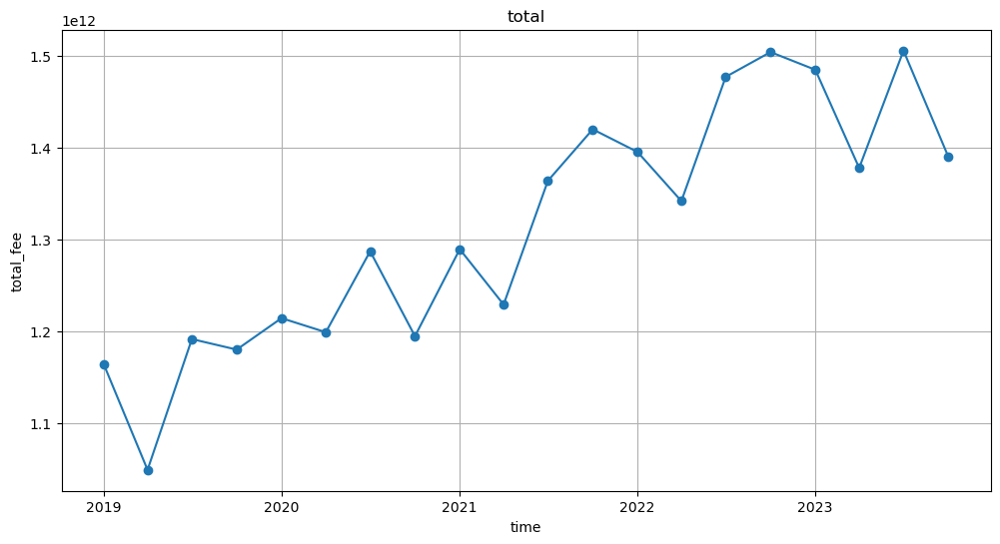

ADF Statistic: -1.668655503138774
p-value: 0.44733012953105117
                               SARIMAX Results                                
Dep. Variable:                  총매출금액   No. Observations:                   20
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -500.069
Date:                Fri, 30 Aug 2024   AIC                           1006.138
Time:                        00:02:48   BIC                           1008.971
Sample:                    01-01-2019   HQIC                          1006.617
                         - 10-01-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9899      0.056    -17.659      0.000      -1.100      -0.880
ma.L1          0.9638      0.117      8.203      0.000       0.733  

C:\Users\yjk23\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
C:\Users\yjk23\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
C:\Users\yjk23\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)


ValueError: invalid literal for int() with base 10: '2019-01-01 00:00:0'

In [51]:
# 2019 ~ 2023 년도 분기 별로 총매출을 뽑고 시각화 및 차분 과정
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
# 데이터 로드 (예시: 'data.csv' 파일에서)
data = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/all_year_seoul_salay.csv")
# 기준_년분기_코드 열을 datetime으로 변환
def convert_to_datetime(quarter_code):
    year = int(str(quarter_code)[:-1])  # 연도 추출
    quarter = int(str(quarter_code)[-1])  # 분기 추출
    month = (quarter - 1) * 3 + 1  # 분기를 월로 변환 (1, 4, 7, 10)
    return pd.Timestamp(year=year, month=month, day=1)



# 새로운 열 추가
data['기준_년분기_코드'] = data['기준_년분기_코드'].apply(convert_to_datetime)
# 분기별 총매출 계산
data['총매출금액'] = data['금천구']  # 당월 매출 금액이 있는 열 이름을 사용하세요
quarterly_sales = data.groupby('기준_년분기_코드')['총매출금액'].sum().reset_index()
# 시계열 데이터로 설정
quarterly_sales.set_index('기준_년분기_코드', inplace=True)
# 시계열 데이터 시각화
plt.figure(figsize=(12, 6))
plt.plot(quarterly_sales, marker='o')
plt.title('total')
plt.xlabel('time')
plt.ylabel('total_fee')
plt.grid()
plt.show()
# ADF 검정으로 정상성 확인
adf_result = adfuller(quarterly_sales['총매출금액'])
print('ADF Statistic:', adf_result[0])
print('p-value:', adf_result[1])
# ARIMA 모델 적합
model = ARIMA(quarterly_sales['총매출금액'], order=(1, 1, 1))  # (p, d, q) 값은 데이터에 따라 조정 필요
model_fit = model.fit()
# 모델 요약
print(model_fit.summary())
# 예측
forecast = model_fit.forecast(steps=4)  # 다음 4분기 예측
print('다음 4분기 총매출 예측:', forecast)

In [11]:
import pandas as pd

# CSV 파일 읽어오기
df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_2023.csv", encoding="utf-8-sig", low_memory=False)

# 집계할 분기 및 업종 정의
quarters = [20231, 20232, 20233, 20234]
cooks = ['요식업', '서비스업', '판매업']

# 결과를 저장할 리스트 초기화
sales_data = []

# 각 분기별로 데이터 집계
for quarter in quarters:
    for cook in cooks:
        # 분기 및 업종 필터링
        filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
        
        # 지역구별로 매출 합산
        regional_sales = filtered_df.groupby('상권_코드')['당월_매출_금액'].sum().reset_index()

        # 결과를 sales_data 리스트에 추가
        for _, row in regional_sales.iterrows():
            sales_data.append({
                '기준_년분기_코드': quarter,
                '업종': cook,
                '상권_코드': row['상권_코드'],
                '총 매출': row['당월_매출_금액']
            })

# 결과 데이터프레임 생성
df1 = pd.DataFrame(sales_data)

# 결과 출력 (옵션)
print("지역구별 업종 매출 데이터:")
print(df1)

# CSV 파일로 저장
df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_총매출.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")

지역구별 업종 매출 데이터:
     기준_년분기_코드   업종 상권_코드          총 매출
0        20231  요식업   강남구  883404177414
1        20231  요식업   강동구  396014701083
2        20231  요식업   강북구  313540574546
3        20231  요식업   강서구  433169350183
4        20231  요식업   관악구  489638831577
..         ...  ...   ...           ...
295      20234  판매업   용산구  721567466430
296      20234  판매업   은평구  569409425477
297      20234  판매업   종로구  402883204824
298      20234  판매업    중구  363490683516
299      20234  판매업   중랑구  706008626361

[300 rows x 4 columns]
CSV 파일이 성공적으로 생성되었습니다.


In [15]:
import pandas as pd

# 처리할 연도 및 분기 정의
years = [2019,2020,2021,2022, 2023]
quarters = {
    2019: [20191, 20192, 20193, 20194],
    2020: [20201, 20202, 20203, 20204],
    2021: [20211, 20212, 20213, 20214],
    2022: [20221, 20222, 20223, 20224],
    2023: [20231, 20232, 20233, 20234]
}
cooks = ['요식업', '서비스업', '판매업']

# 결과를 저장할 리스트 초기화
sales_data = []

# 각 연도 및 분기별로 데이터 집계
for year in years:
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" + f"{year}.csv", encoding="utf-8-sig", low_memory=False)
    
    for quarter in quarters[year]:
        for cook in cooks:
            # 분기 및 업종 필터링
            filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
            
            # 지역구별로 매출 합산
            regional_sales = filtered_df.groupby('상권_코드')['당월_매출_금액'].sum().reset_index()

            # 결과를 sales_data 리스트에 추가
            for _, row in regional_sales.iterrows():
                sales_data.append({
                    '기준_년분기_코드': quarter,
                    '업종': cook,
                    '상권_코드': row['상권_코드'],
                    '총 매출': row['당월_매출_금액']
                })

# 결과 데이터프레임 생성
df1 = pd.DataFrame(sales_data)

# 결과 출력 (옵션)
print("지역구별 업종 매출 데이터:")
print(df1)

# CSV 파일로 저장
df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_총매출.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")

지역구별 업종 매출 데이터:
      기준_년분기_코드   업종 상권_코드          총 매출
0         20191  요식업   강남구  537217062140
1         20191  요식업   강동구  249142285065
2         20191  요식업   강북구  202769098839
3         20191  요식업   강서구  288093723965
4         20191  요식업   관악구  312079444988
...         ...  ...   ...           ...
1495      20234  판매업   용산구  721567466430
1496      20234  판매업   은평구  569409425477
1497      20234  판매업   종로구  402883204824
1498      20234  판매업    중구  363490683516
1499      20234  판매업   중랑구  706008626361

[1500 rows x 4 columns]
CSV 파일이 성공적으로 생성되었습니다.


In [54]:
import pandas as pd

# 처리할 연도 및 분기 정의
years = [2019, 2020, 2021, 2022, 2023]
quarters = {
    2019: [20191, 20192, 20193, 20194],
    2020: [20201, 20202, 20203, 20204],
    2021: [20211, 20212, 20213, 20214],
    2022: [20221, 20222, 20223, 20224],
    2023: [20231, 20232, 20233, 20234]
}
cooks = ['요식업', '서비스업', '판매업']

# 결과를 저장할 리스트 초기화
sales_data = []

# 각 연도 및 분기별로 데이터 집계
for year in years:
    df = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/main_" + f"{year}.csv", encoding="utf-8-sig", low_memory=False)
    
    for quarter in quarters[year]:
        for cook in cooks:
            # 분기 및 업종 필터링
            filtered_df = df[(df['기준_년분기_코드'] == quarter) & (df['업종_전처리'] == cook)]
            
            # 지역구별로 남성 및 여성 매출 건수 합산
            regional_sales = filtered_df.groupby('상권_코드')[['남성_매출_건수', '여성_매출_건수']].sum().reset_index()

            # 결과를 sales_data 리스트에 추가
            for _, row in regional_sales.iterrows():
                sales_data.append({
                    '기준_년분기_코드': quarter,
                    '업종': cook,
                    '상권_코드': row['상권_코드'],
                    '남성_매출_건수': row['남성_매출_건수'],
                    '여성_매출_건수': row['여성_매출_건수']
                })

# 결과 데이터프레임 생성
df1 = pd.DataFrame(sales_data)

# 결과 출력 (옵션)
print("지역구별 업종 매출 데이터:")
print(df1)

# CSV 파일로 저장
df1.to_csv("C:/Users/yjk23/sf6-data/data_csv/남성_여성.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")


지역구별 업종 매출 데이터:
      기준_년분기_코드   업종 상권_코드  남성_매출_건수  여성_매출_건수
0         20191  요식업   강남구  10104528   9811972
1         20191  요식업   강동구   6004876   5175984
2         20191  요식업   강북구   4372044   3739571
3         20191  요식업   강서구   6656721   5898168
4         20191  요식업   관악구   8937600   6994337
...         ...  ...   ...       ...       ...
1495      20234  판매업   용산구  13127517  11050461
1496      20234  판매업   은평구  17553611  16061451
1497      20234  판매업   종로구   9308005   8208348
1498      20234  판매업    중구   7144773   6396125
1499      20234  판매업   중랑구  20211777  19037004

[1500 rows x 5 columns]
CSV 파일이 성공적으로 생성되었습니다.


In [ ]:
#지역구별 시계열 분석

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import warnings
from matplotlib.ticker import FuncFormatter
plt.rc('font', family= "Malgun Gothic")

# Y축을 조 단위로 포맷하는 함수
def billions(x, pos):
    return '%1.1f조' % (x * 1e-12)

formatter = FuncFormatter(billions)

# 경고 메시지 무시
warnings.filterwarnings("ignore")

# 데이터 로드 (예시: 'data.csv' 파일에서)
data = pd.read_csv("C:/Users/alfm0/sf6-data/data_csv/지역구별_업종별_총매출.csv")

# 날짜 칼럼을 datetime 형식으로 변환
def convert_to_datetime(year_quarter):
    year = int(str(year_quarter)[:-1])  # 연도 추출
    quarter = int(str(year_quarter)[-1])  # 분기 추출
    month = (quarter - 1) * 3 + 1  # 첫 달 계산
    return pd.Timestamp(year=year, month=month, day=1)

data['기준_년분기_코드'] = data['기준_년분기_코드'].apply(convert_to_datetime)
data.set_index('기준_년분기_코드', inplace=True)

# 지역구 리스트
지역구_list = [
    '금천구', '중랑구', '관악구', '구로구', '용산구', '노원구', '동작구',
    '영등포구', '동대문구', '종로구', '성북구', '서대문구', '서초구',
    '은평구', '송파구', '성동구', '강북구', '강서구', '도봉구',
    '광진구', '마포구', '강동구', '강남구', '양천구', '중구'
]

# 결과 저장을 위한 리스트
results_list = []

# 각 지역구에 대해 시계열 분석 수행
for 지역구 in 지역구_list:
    # 시계열 데이터 추출
    시계열_data = data[지역구]

    # ARIMA 모델 적합 (p=1, d=1, q=1은 예시로 설정)
    model = ARIMA(시계열_data, order=(1, 1, 1))
    model_fit = model.fit()

    # p-value 추출
    p_value = model_fit.pvalues[1]  # 1은 AR(1) 계수의 p-value

    # 예측 결과
    forecast = model_fit.forecast(steps=4)

    # 결과 저장
    results_list.append({
        '지역구': 지역구,
        'p-value': p_value,
        '예측값1': forecast[0],
        '예측값2': forecast[1],
        '예측값3': forecast[2],
        '예측값4': forecast[3]
    })

    # 결과 시각화
    plt.figure(figsize=(12, 6))
    plt.plot(시계열_data, label='실제 매출', color='blue')
    plt.plot(forecast.index, forecast, label='예측 매출', color='red', linestyle ='--')

    # 2023년 4분기와 2024년 1분기 점 연결
    plt.plot([시계열_data.index[-1], forecast.index[0]], 
             [시계열_data.iloc[-1], forecast.iloc[0]], 
             color='red', linestyle='--')
    plt.title(f'{지역구} 시계열 분석')
    plt.xlabel('날짜')
    plt.ylabel('매출')
    plt.gca().yaxis.set_major_formatter(formatter)  # Y축을 조 단위로 설정
    plt.legend(loc='upper left')
    plt.grid()
    plt.tight_layout()  # 레이아웃 조정

    plt.savefig(f"C:/Users/alfm0/sf6-data/data_csv/지역구_시계열분석_그래프/{지역구}_시계열_분석.jpg", dpi=300)
    plt.show()

# 결과를 데이터프레임으로 변환
results_df = pd.DataFrame(results_list)

# 결과를 각 지역구별로 CSV 파일로 저장
for 지역구 in 지역구_list:
    구별_result = results_df[results_df['지역구'] == 지역구]
    구별_result.to_csv(f"C:/Users/alfm0/sf6-data/data_csv/{지역구}_결과.csv", index=False, encoding='utf-8-sig')

# 전체 결과 데이터프레임을 CSV로 저장 (옵션)
results_df.to_csv("C:/Users/alfm0/sf6-data/data_csv/전체_결과.csv", index=False, encoding='utf-8-sig')


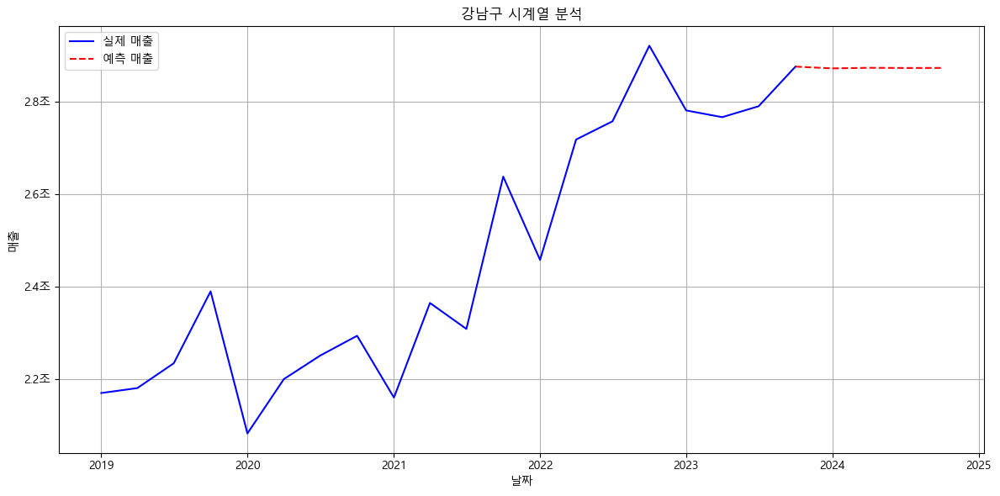

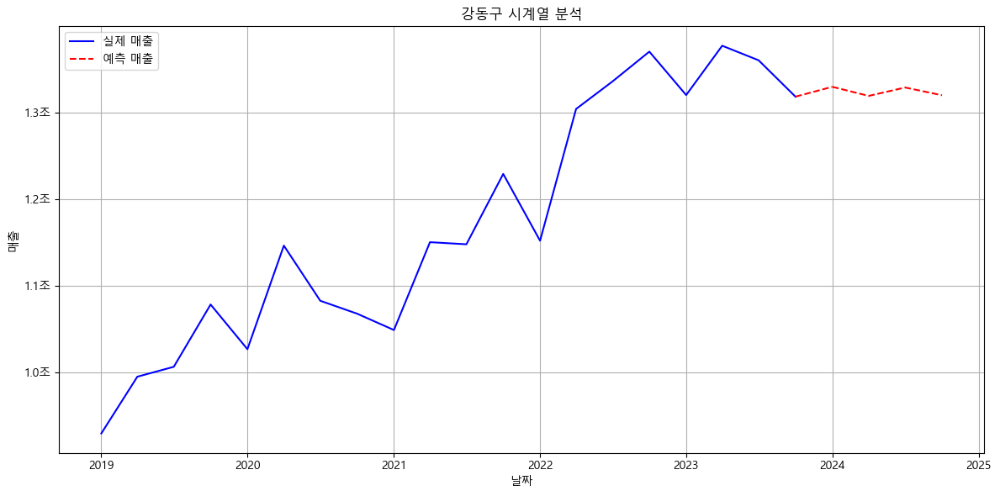

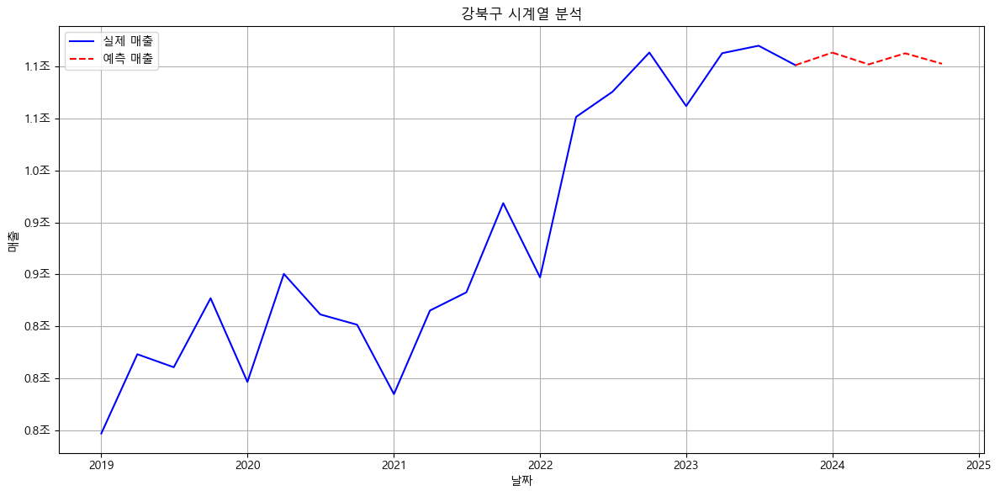

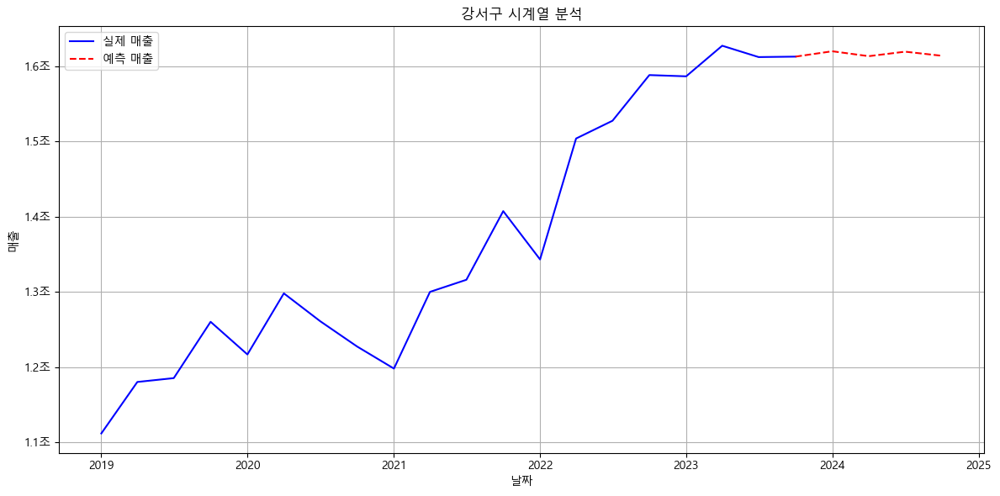

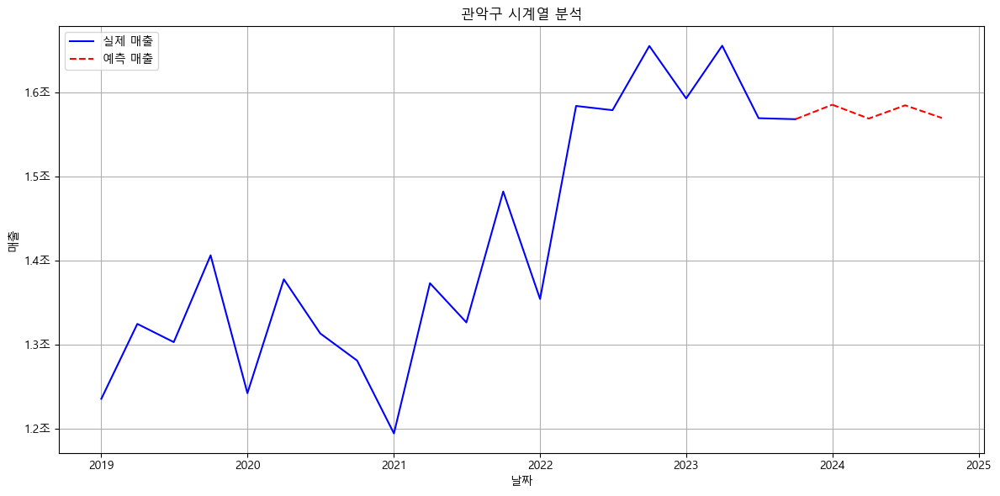

...

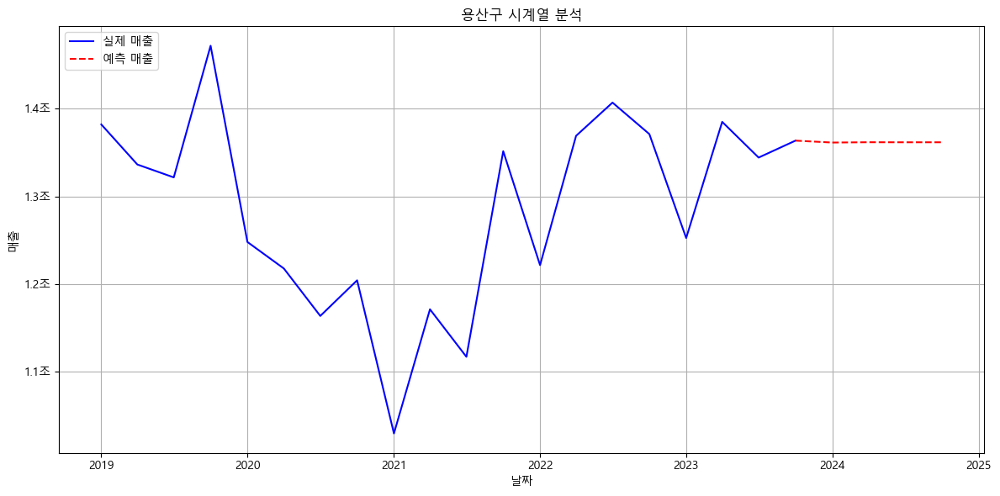

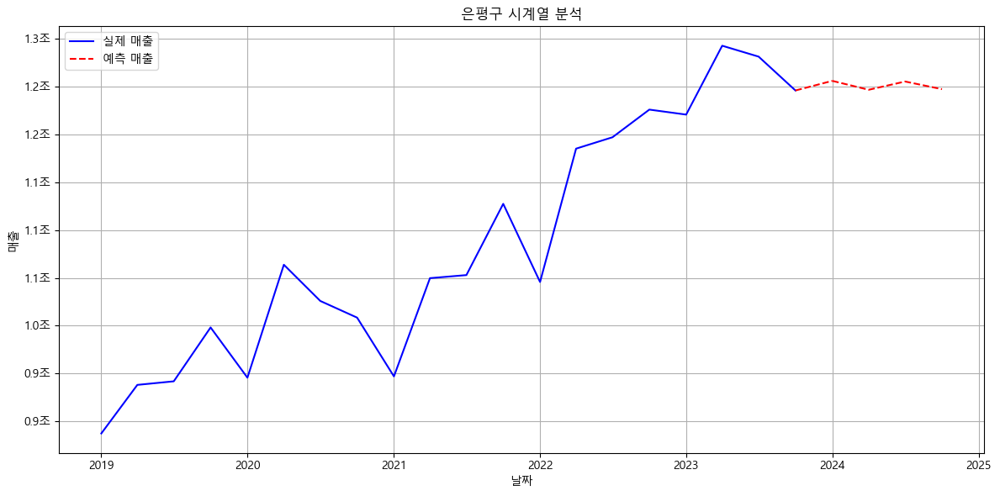

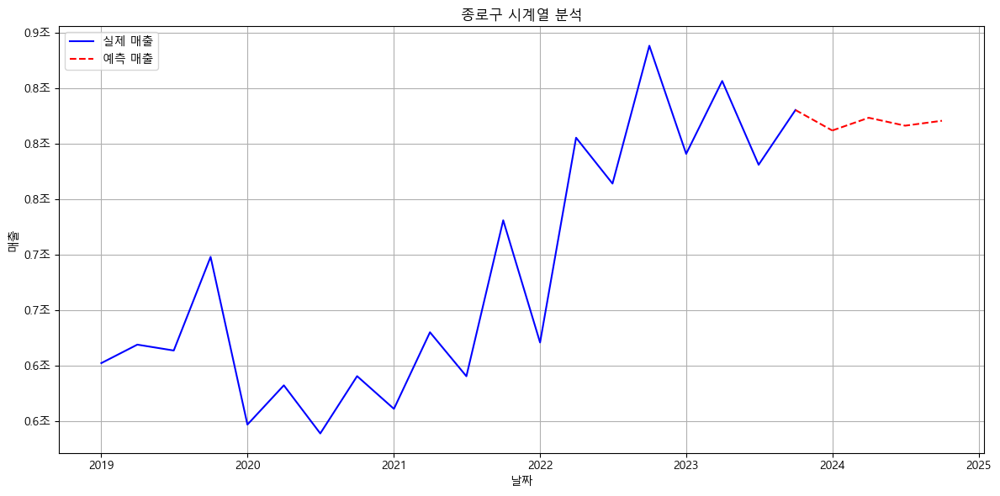

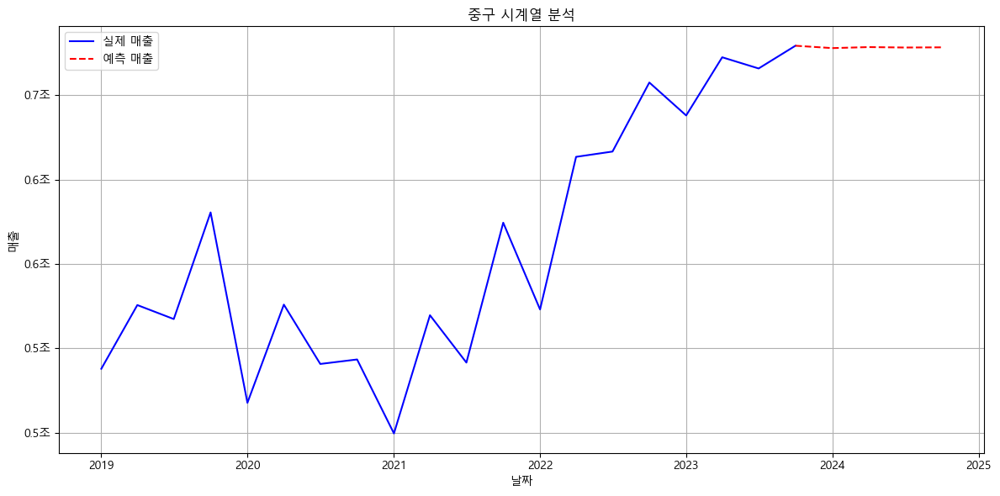

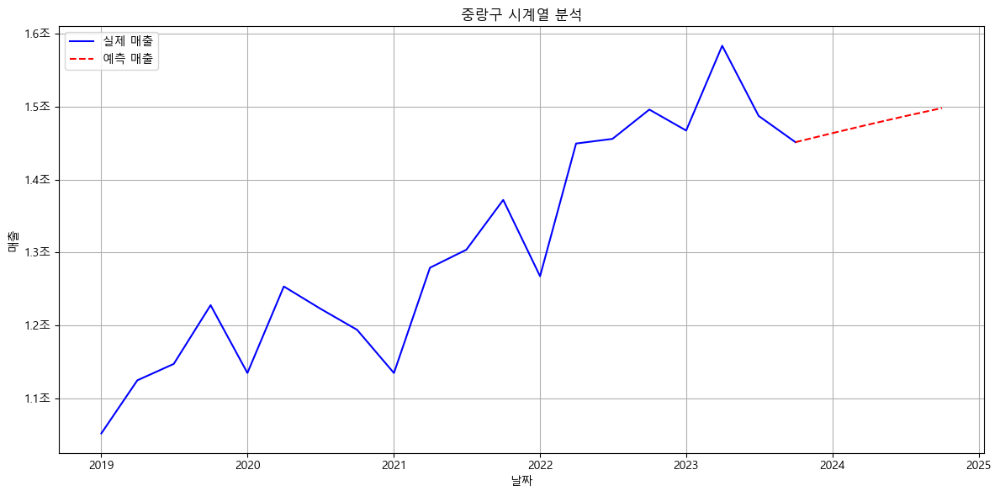

In [39]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import warnings
from matplotlib.ticker import FuncFormatter

# 경고 메시지 무시
warnings.filterwarnings("ignore")

# Y축을 조 단위로 포맷하는 함수
def billions(x, pos):
    return '%1.1f조' % (x * 1e-12)

formatter = FuncFormatter(billions)

# 데이터 로드
data = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_총매출.csv", encoding="utf-8-sig", low_memory=False)

# 날짜 칼럼을 datetime 형식으로 변환
def convert_to_datetime(year_quarter):
    year = int(str(year_quarter)[:-1])  # 연도 추출
    quarter = int(str(year_quarter)[-1])  # 분기 추출
    month = (quarter - 1) * 3 + 1  # 첫 달 계산
    return pd.Timestamp(year=year, month=month, day=1)

data['기준_년분기_코드'] = data['기준_년분기_코드'].apply(convert_to_datetime)

# 매출을 숫자로 변환 (문자열에서 E 표기법 제거)
data['총 매출'] = pd.to_numeric(data['총 매출'], errors='coerce')

# 지역구 리스트
지역구_list = data['상권_코드'].unique()

# 결과 저장을 위한 리스트
results_list = []

# 그래프를 저장할 디렉토리 경로
save_dir = r"C:/Users/yjk23/sf6-data/data_csv/지역구_시계열분석_그래프"

# 디렉토리가 존재하지 않으면 생성
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# 각 지역구에 대해 시계열 분석 수행
for 지역구 in 지역구_list:
    # 지역구와 업종별로 데이터 필터링
    지역구_data = data[data['상권_코드'] == 지역구]
    
    # 기준 년 분기 코드로 그룹화하여 총 매출 집계
    시계열_data = 지역구_data.groupby('기준_년분기_코드')['총 매출'].sum()
    
    # ARIMA 모델 적합 (p=1, d=1, q=1은 예시로 설정)
    model = ARIMA(시계열_data, order=(1, 1, 1))
    model_fit = model.fit()

    # p-value 추출
    p_value = model_fit.pvalues[1]  # 1은 AR(1) 계수의 p-value

    # 예측 결과
    forecast = model_fit.forecast(steps=4)

    # 결과 저장
    results_list.append({
        '지역구': 지역구,
        'p-value': p_value,
        '예측값1': forecast[0],
        '예측값2': forecast[1],
        '예측값3': forecast[2],
        '예측값4': forecast[3]
    })

    # 결과 시각화
    plt.figure(figsize=(12, 6))
    plt.plot(시계열_data, label='실제 매출', color='blue')
    plt.plot(forecast.index, forecast, label='예측 매출', color='red', linestyle ='--')

    # 2023년 4분기와 2024년 1분기 점 연결
    plt.plot([시계열_data.index[-1], forecast.index[0]], 
             [시계열_data.iloc[-1], forecast.iloc[0]], 
             color='red', linestyle='--')
    plt.title(f'{지역구} 시계열 분석')
    plt.xlabel('날짜')
    plt.ylabel('매출')
    plt.gca().yaxis.set_major_formatter(formatter)  # Y축을 조 단위로 설정
    plt.legend(loc='upper left')
    plt.grid()
    plt.tight_layout()  # 레이아웃 조정

    # 그래프 저장
    plt.savefig(os.path.join(save_dir, f"{지역구}_시계열_분석.jpg"), dpi=300)
    plt.show()

# 결과를 데이터프레임으로 변환
results_df = pd.DataFrame(results_list)

# 결과를 각 지역구별로 CSV 파일로 저장
for 지역구 in 지역구_list:
    구별_result = results_df[results_df['지역구'] == 지역구]
    구별_result.to_csv(f"C:/Users/yjk23/sf6-data/data_csv/{지역구}_결과.csv", index=False, encoding='utf-8-sig')

# 전체 결과 데이터프레임을 CSV로 저장 (옵션)
results_df.to_csv("C:/Users/yjk23/sf6-data/data_csv/전체_결과.csv", index=False, encoding='utf-8-sig')


['강남구' '강동구' '강북구' '강서구' '관악구' '광진구' '구로구' '금천구' '노원구' '도봉구' '동대문구' '동작구'
 '마포구' '서대문구' '서초구' '성동구' '성북구' '송파구' '양천구' '영등포구' '용산구' '은평구' '종로구' '중구'
 '중랑구']


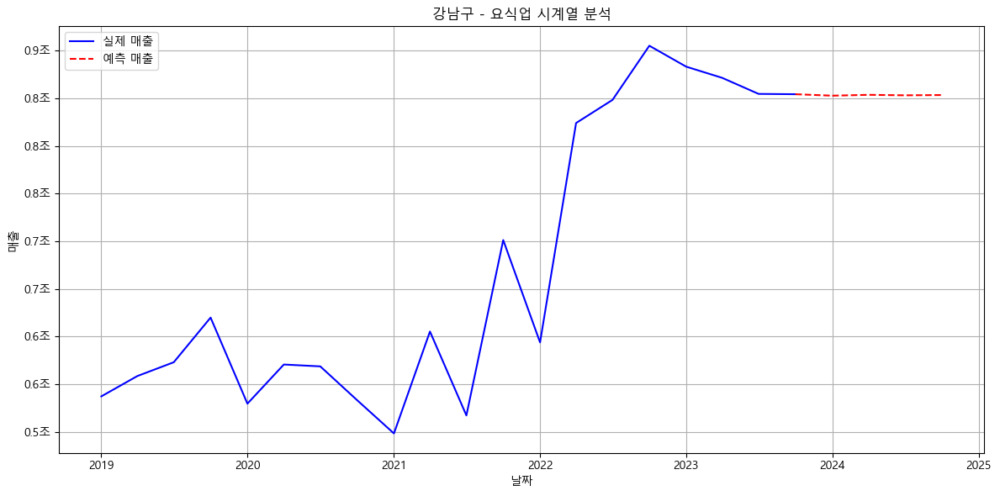

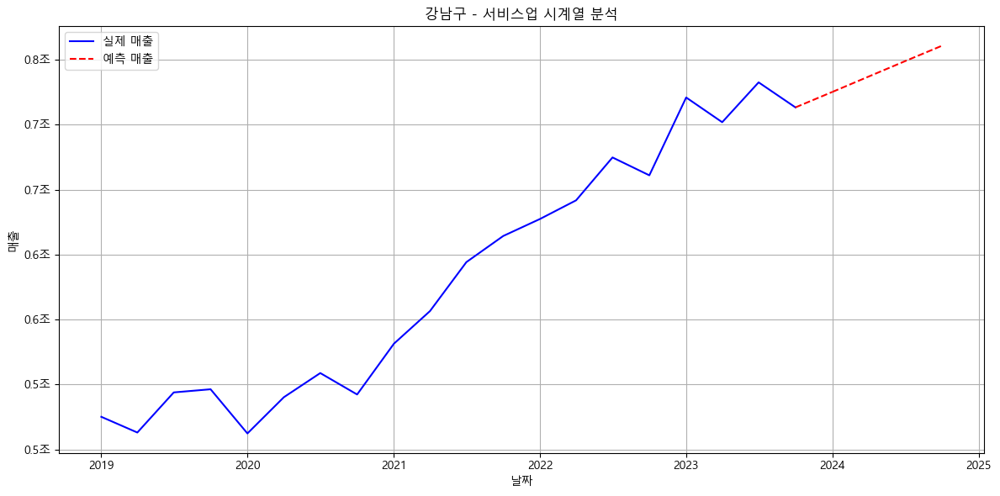

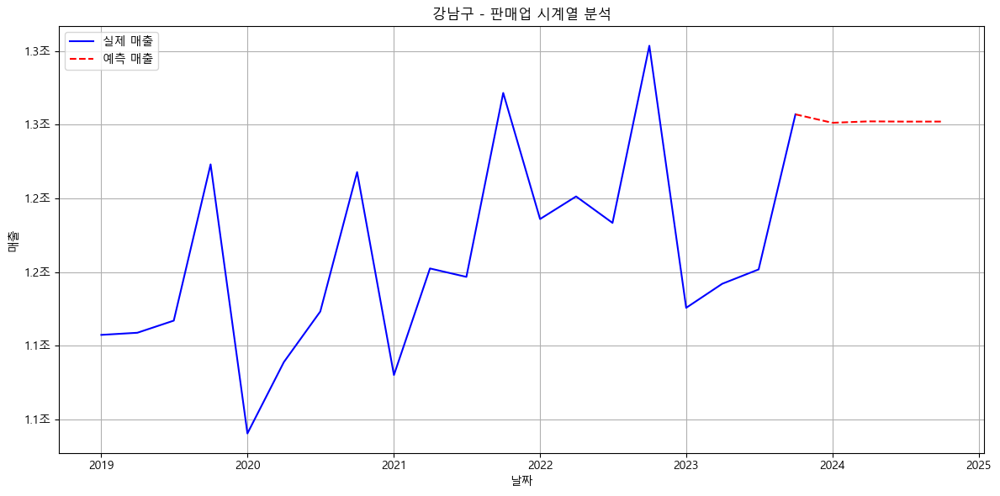

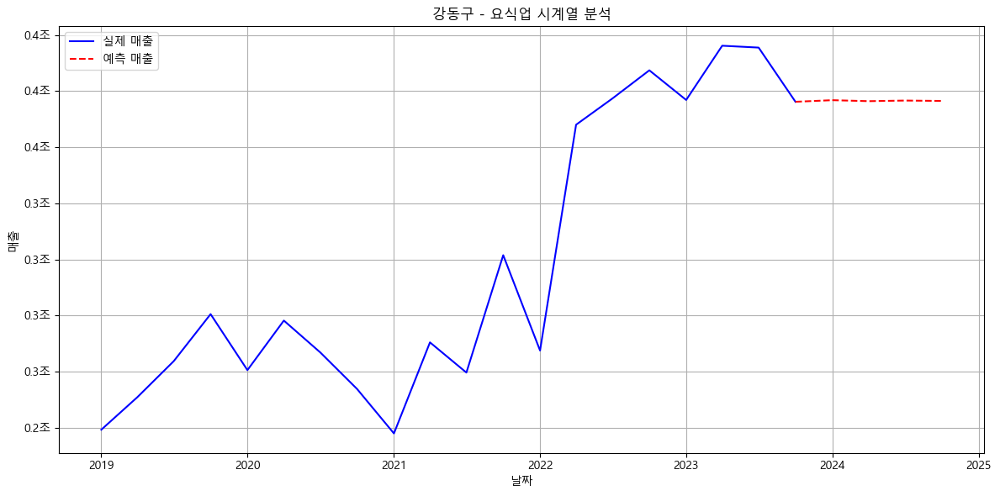

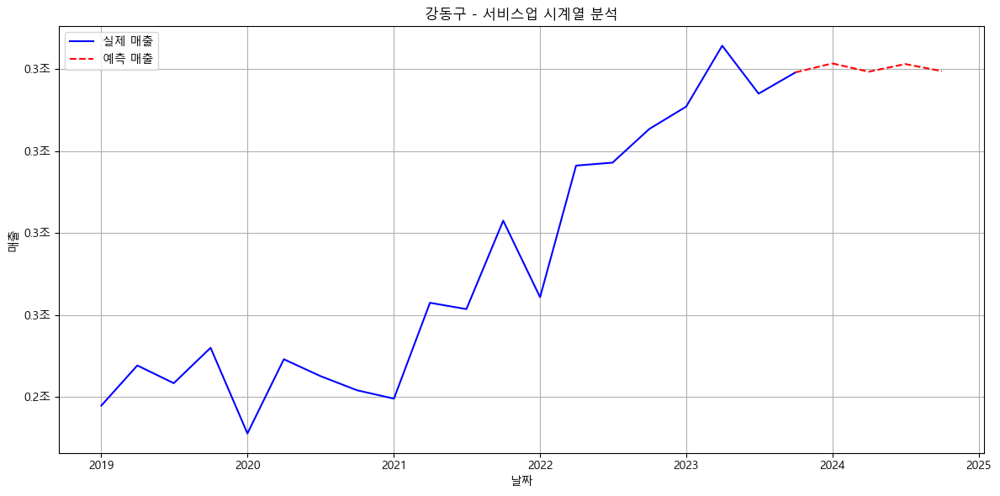

...

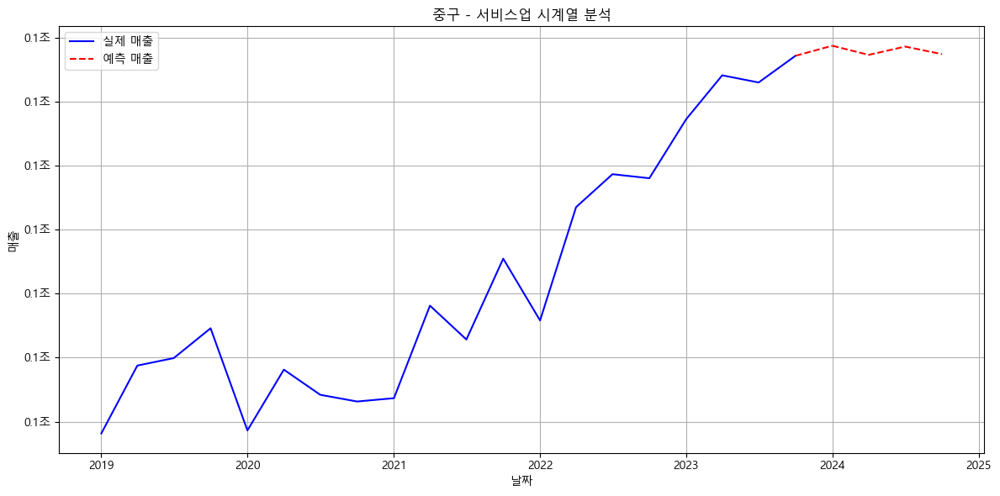

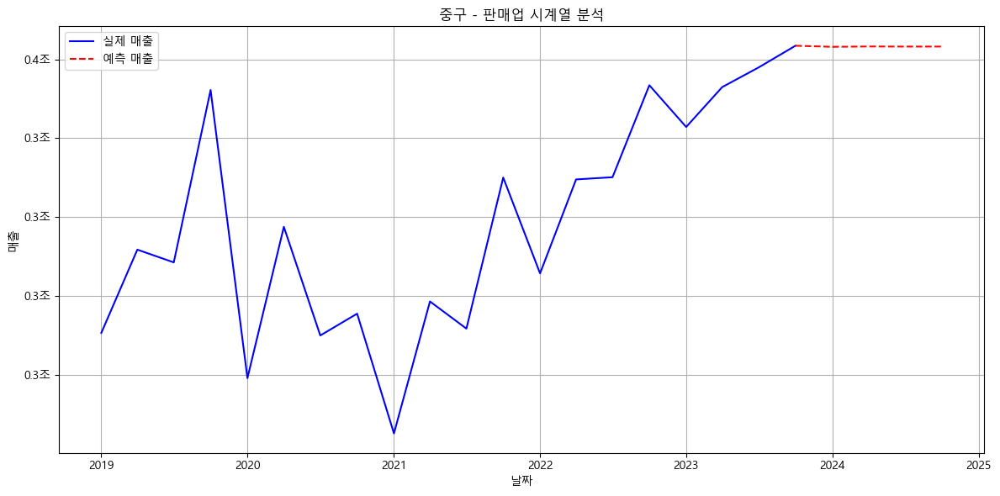

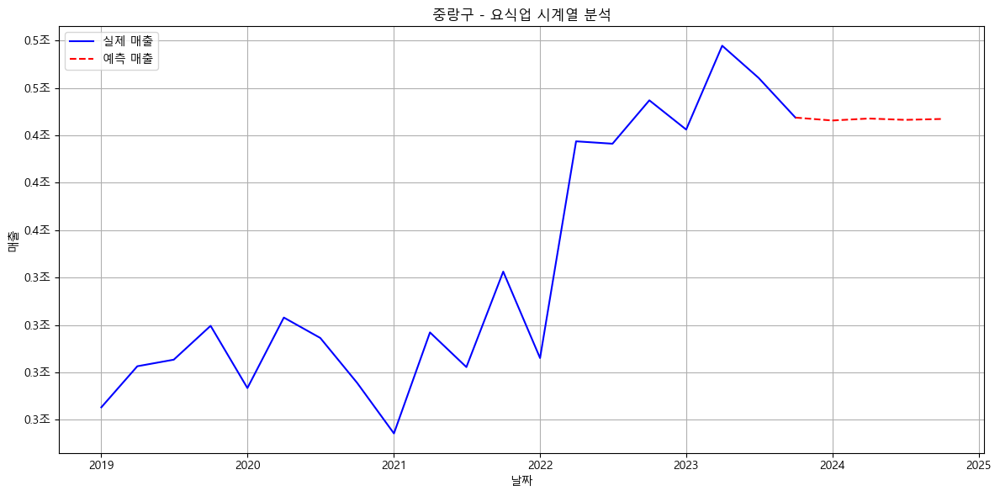

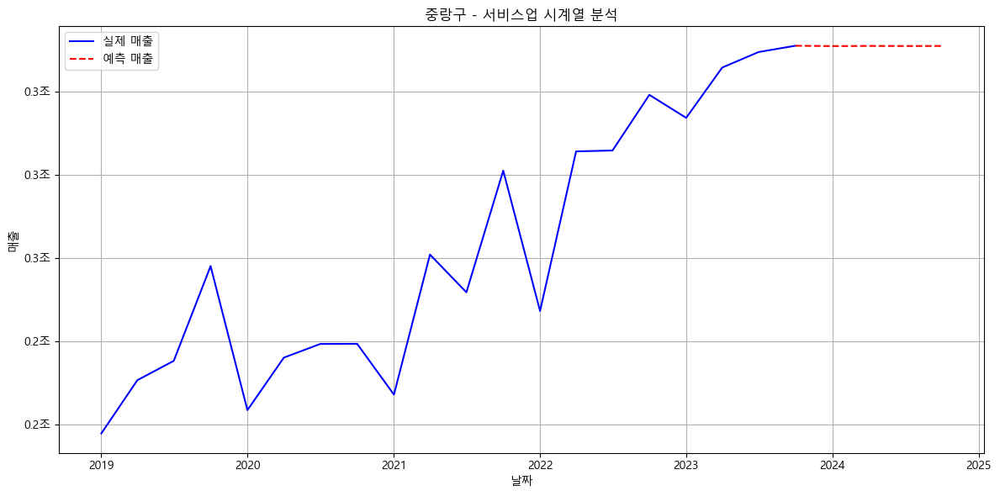

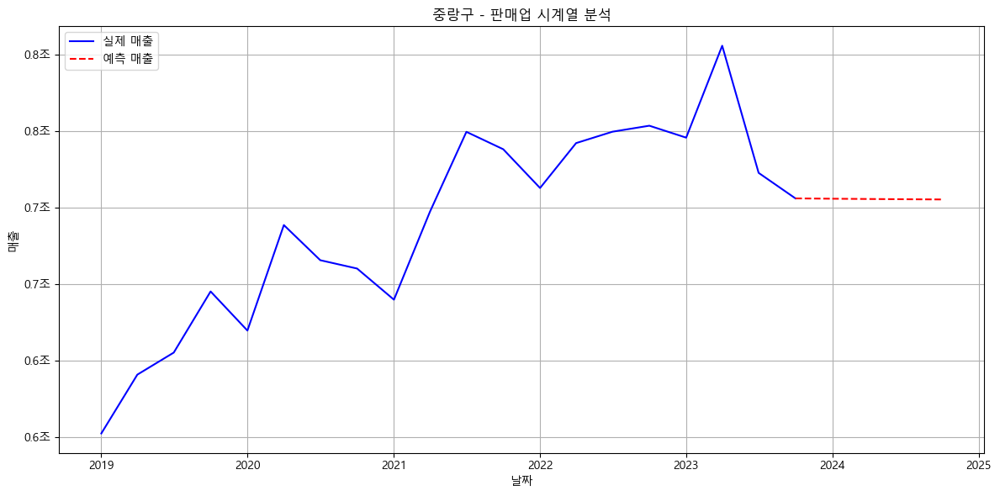

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import warnings
from matplotlib.ticker import FuncFormatter
import os

# 경고 메시지 무시
warnings.filterwarnings("ignore")

# Y축을 조 단위로 포맷하는 함수
def billions(x, pos):
    return '%1.1f조' % (x * 1e-12)

formatter = FuncFormatter(billions)

# 데이터 로드
data = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_총매출.csv", encoding="utf-8-sig", low_memory=False)

# 날짜 칼럼을 datetime 형식으로 변환
def convert_to_datetime(year_quarter):
    year = int(str(year_quarter)[:-1])  # 연도 추출
    quarter = int(str(year_quarter)[-1])  # 분기 추출
    month = (quarter - 1) * 3 + 1  # 첫 달 계산
    return pd.Timestamp(year=year, month=month, day=1)

data['기준_년분기_코드'] = data['기준_년분기_코드'].apply(convert_to_datetime)

# 매출을 숫자로 변환 (문자열에서 E 표기법 제거)
data['총 매출'] = pd.to_numeric(data['총 매출'], errors='coerce')

# 지역구 리스트
지역구_list = data['상권_코드'].unique()
print(지역구_list)
# 결과 저장을 위한 리스트
results_list = []

# 각 지역구에 대해 업종별 시계열 분석 수행
for 지역구 in 지역구_list:
    # 지역구별 데이터 필터링
    지역구_data = data[data['상권_코드'] == 지역구]
    
    # 업종별로 그룹화
    업종별_list = 지역구_data['업종'].unique()
    
    for 업종 in 업종별_list:
        # 업종별 데이터 필터링
        업종_data = 지역구_data[지역구_data['업종'] == 업종]
        
        # 기준 년 분기 코드로 그룹화하여 총 매출 집계
        시계열_data = 업종_data.groupby('기준_년분기_코드')['총 매출'].sum()
        
        # ARIMA 모델 적합 (p=1, d=1, q=1은 예시로 설정)
        model = ARIMA(시계열_data, order=(1, 1, 1))
        model_fit = model.fit()

        # p-value 추출
        p_value = model_fit.pvalues[1]  # 1은 AR(1) 계수의 p-value

        # 예측 결과
        forecast = model_fit.forecast(steps=4)

        # 결과 저장
        results_list.append({
            '지역구': 지역구,
            '업종': 업종,
            'p-value': p_value,
            '20241': forecast[0],
            '20242': forecast[1],
            '20243': forecast[2],
            '20244': forecast[3]
        })

        # 결과 시각화
        plt.figure(figsize=(12, 6))
        plt.plot(시계열_data, label='실제 매출', color='blue')
        plt.plot(forecast.index, forecast, label='예측 매출', color='red', linestyle='--')

        # 2023년 4분기와 2024년 1분기 점 연결
        plt.plot([시계열_data.index[-1], forecast.index[0]], 
                 [시계열_data.iloc[-1], forecast.iloc[0]], 
                 color='red', linestyle='--')
        plt.title(f'{지역구} - {업종} 시계열 분석')
        plt.xlabel('날짜')
        plt.ylabel('매출')
        plt.gca().yaxis.set_major_formatter(formatter)  # Y축을 조 단위로 설정
        plt.legend(loc='upper left')
        plt.grid()
        plt.tight_layout()  # 레이아웃 조정

        # 그래프 저장 경로 설정
        save_dir = f"C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_시계열분석_그래프/{지역구}"
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        
        # 그래프 저장
        plt.savefig(os.path.join(save_dir, f"{업종}_시계열_분석.jpg"), dpi=300)
        plt.show()

# 결과를 데이터프레임으로 변환
results_df = pd.DataFrame(results_list)

# 결과를 CSV 파일로 저장
results_df.to_csv("C:/Users/yjk23/sf6-data/data_csv/전체_지역구별_업종별_결과.csv", index=False, encoding='utf-8-sig')


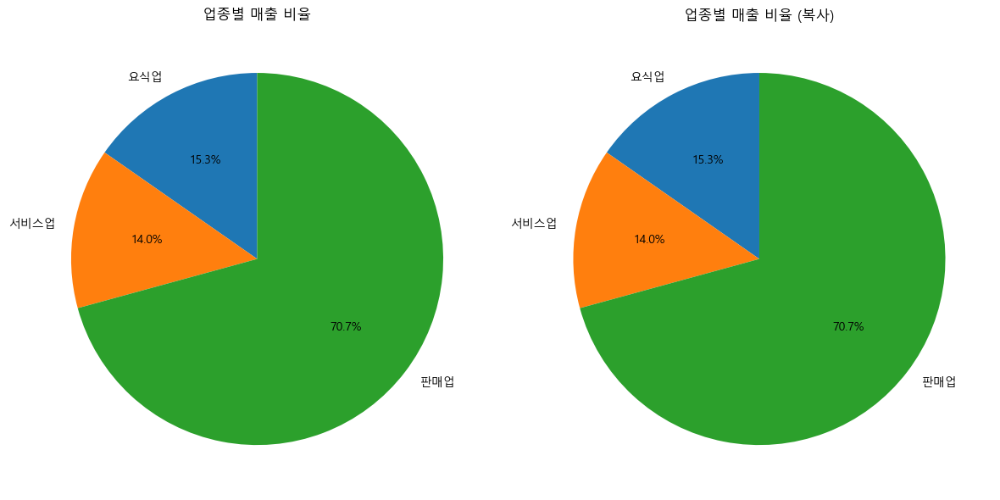

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# 예시 데이터 (result_values의 값)
result_values = [224859120915.4553, 205079932792.4237, 1039431544937.1664]
industries = ['요식업', '서비스업', '판매업']  # 업종 이름

# 전체 그래프 공간 만들기 (1행 2열의 서브플롯)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))  # 두 개의 서브플롯 생성
plt.rc('font', family='Malgun Gothic')  # 한글 폰트 설정

# 첫 번째 파이 그래프
ax[0].pie(result_values, labels=industries, autopct='%.1f%%', startangle=90)
ax[0].set_title('업종별 매출 비율')  # 제목 설정
ax[0].set_ylabel('')  # y축 라벨 제거

# 두 번째 파이 그래프
ax[1].pie(result_values, labels=industries, autopct='%.1f%%', startangle=90)
ax[1].set_title('업종별 매출 비율 (복사)')  # 제목 설정
ax[1].set_ylabel('')  # y축 라벨 제거

# 서브플롯 간의 간격 조정
plt.subplots_adjust(wspace=0.3)  # wspace: 수평 간격 조정

# 그래프 표시
plt.tight_layout()  # 레이아웃 자동 조정
plt.show()  # 그래프 출력


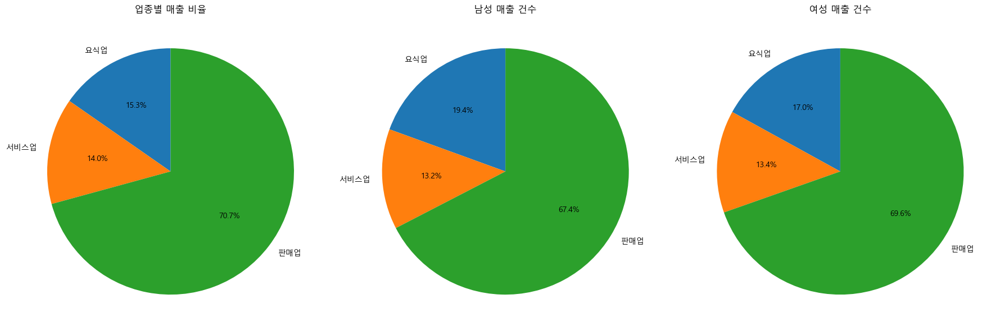

In [61]:
import numpy as np
import matplotlib.pyplot as plt

# 예시 데이터 (result_values의 값)
result_values = [224859120915.4553, 205079932792.4237, 1039431544937.1664]
result_gender_man_values = [4629748.603648463, 3133826.665342624, 16047431.804946974]
result_gender_woman_values = [3608520.9769906607, 2852022.1744583864, 14787995.470724894]
industries = ['요식업', '서비스업', '판매업']  # 업종 이름

# 전체 그래프 공간 만들기 (1행 3열의 서브플롯)
fig, ax = plt.subplots(1, 3, figsize=(18, 6))  # 세 개의 서브플롯 생성
plt.rc('font', family='Malgun Gothic')  # 한글 폰트 설정

# 첫 번째 파이 그래프
ax[0].pie(result_values, labels=industries, autopct='%.1f%%', startangle=90)
ax[0].set_title('업종별 매출 비율')  # 제목 설정
ax[0].set_ylabel('')  # y축 라벨 제거

# 두 번째 파이 그래프
ax[1].pie(result_gender_man_values, labels=industries, autopct='%.1f%%', startangle=90)
ax[1].set_title('남성 매출 건수')  # 제목 설정
ax[1].set_ylabel('')

# 세 번째 파이 그래프
ax[2].pie(result_gender_woman_values, labels=industries, autopct='%.1f%%', startangle=90)
ax[2].set_title('여성 매출 건수')  # 제목 설정
ax[2].set_ylabel('')

# 서브플롯 간의 간격 조정
plt.subplots_adjust(wspace=0.3)  # wspace: 수평 간격 조정

# 그래프 표시
plt.tight_layout()  # 레이아웃 자동 조정
plt.show()  # 그래프 출력


['강남구' '강동구' '강북구' '강서구' '관악구' '광진구' '구로구' '금천구' '노원구' '도봉구' '동대문구' '동작구'
 '마포구' '서대문구' '서초구' '성동구' '성북구' '송파구' '양천구' '영등포구' '용산구' '은평구' '종로구' '중구'
 '중랑구']


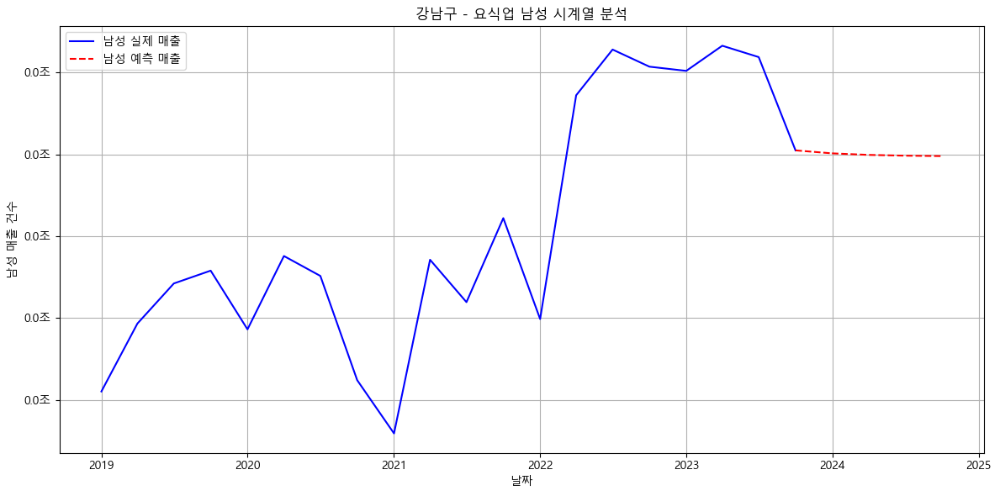

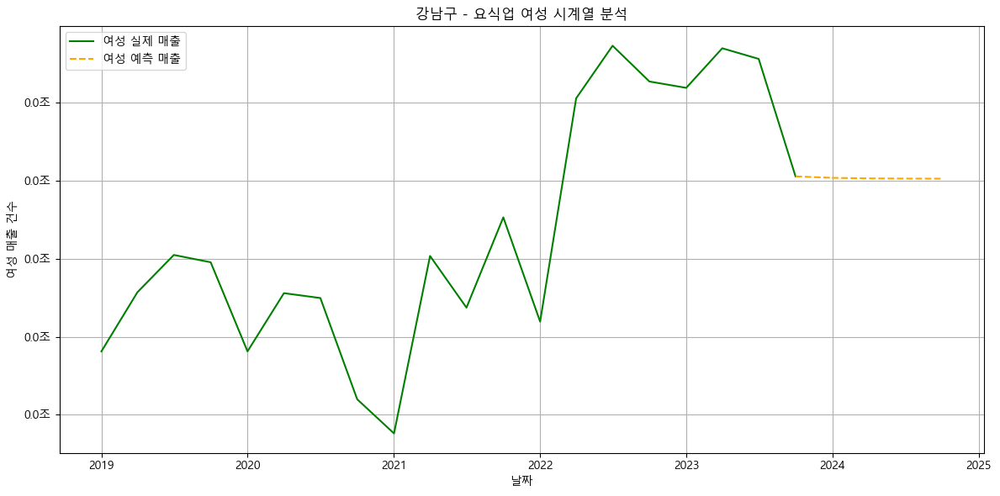

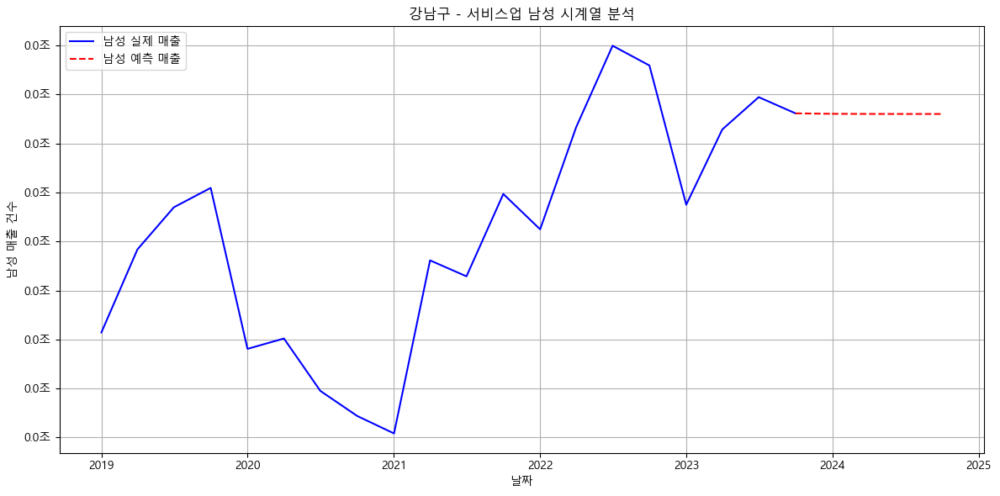

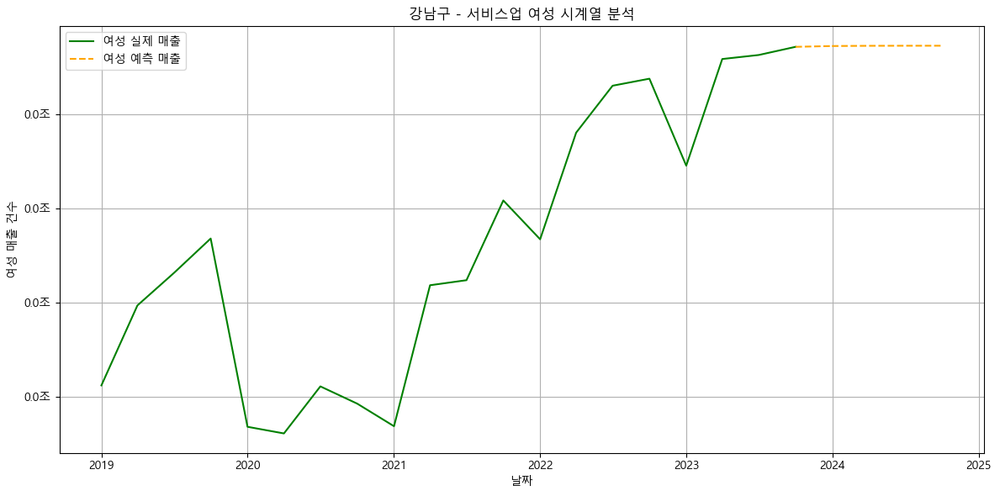

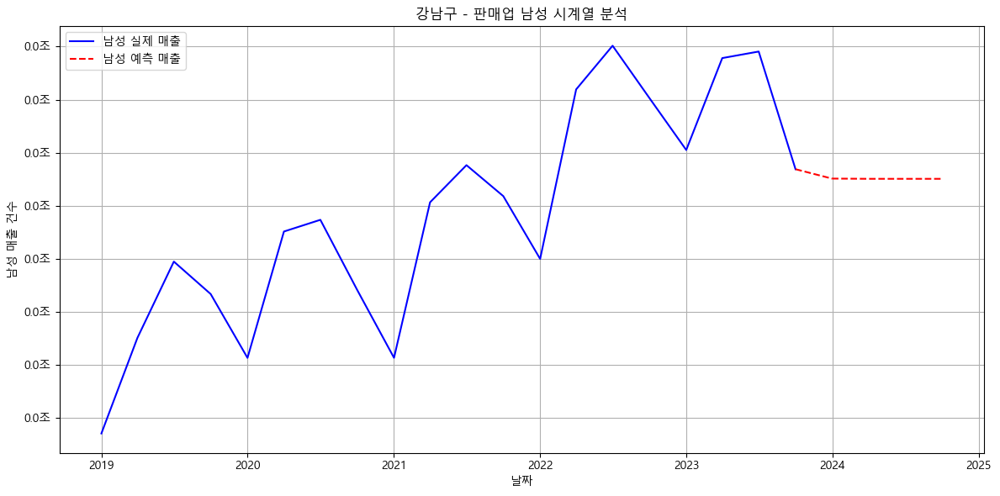

...

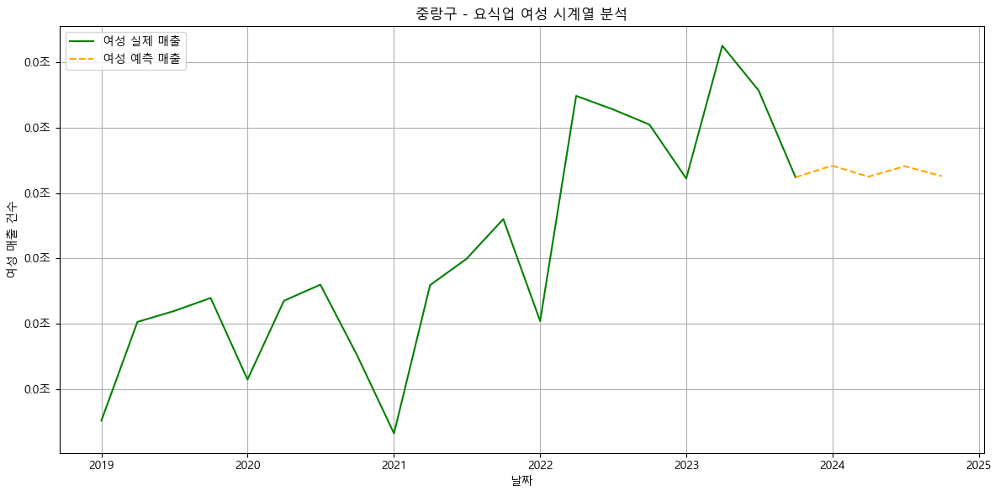

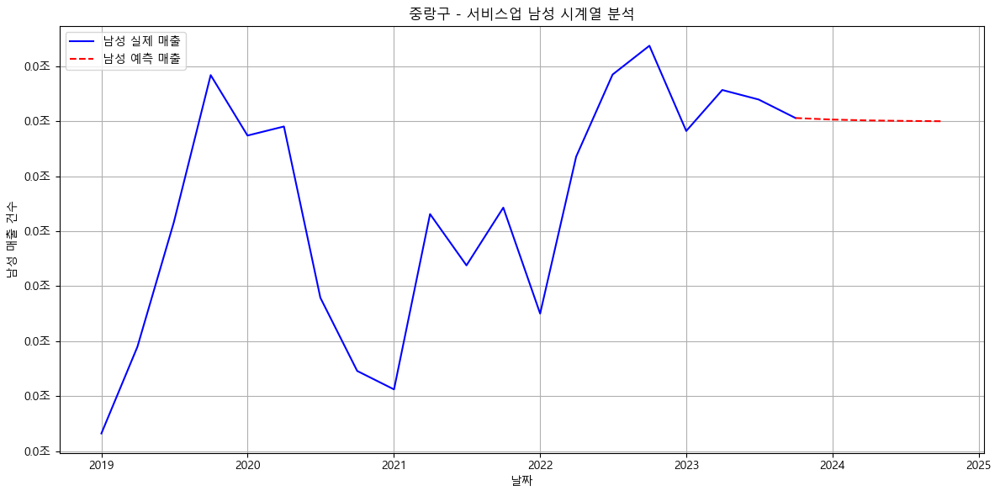

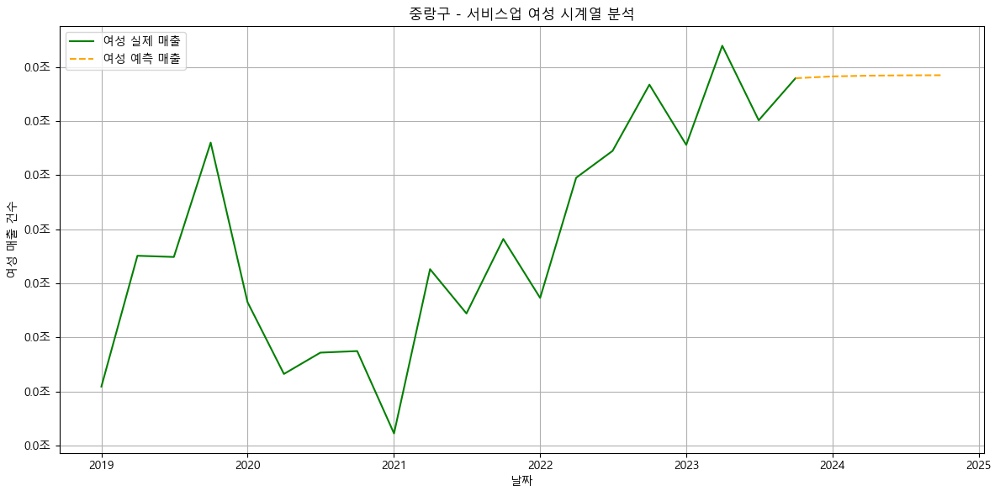

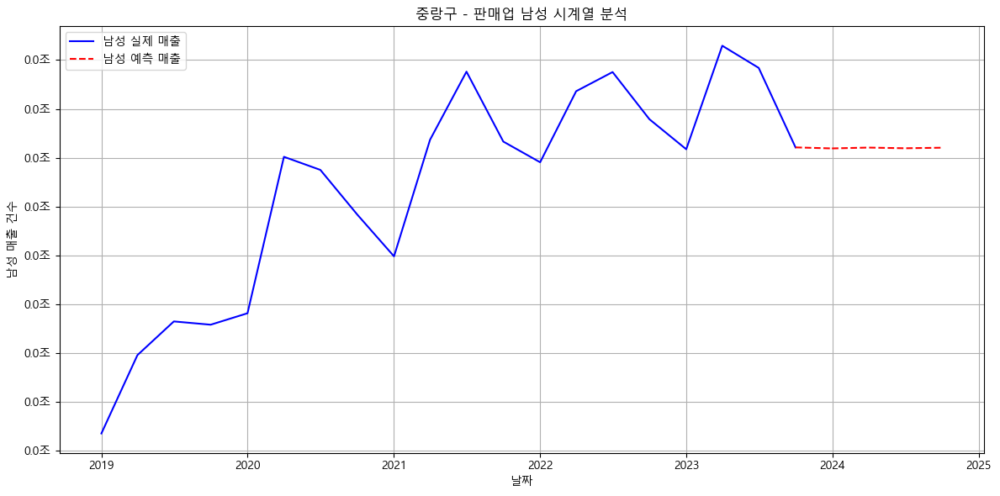

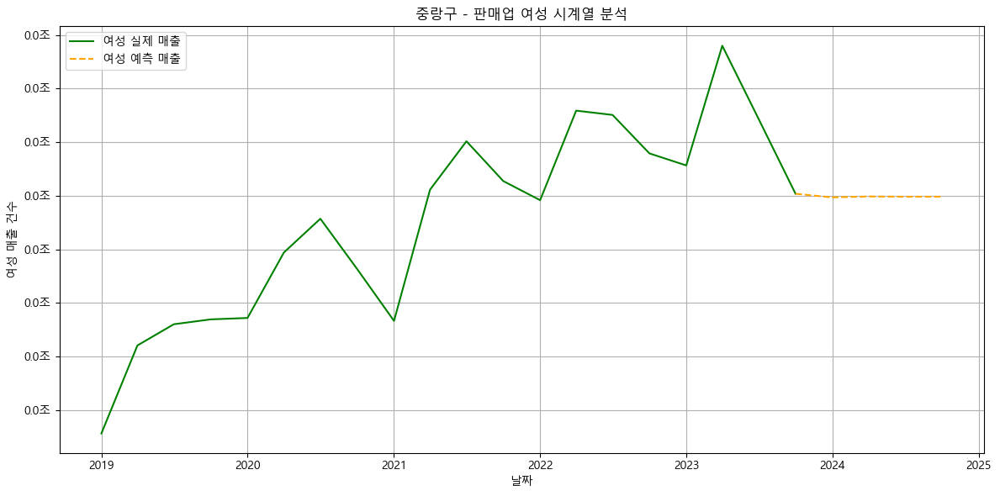

PermissionError: [Errno 13] Permission denied: 'C:/Users/yjk23/sf6-data/data_csv/전체_지역구별_남성_여성.csv'

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import warnings
from matplotlib.ticker import FuncFormatter
import os

# 경고 메시지 무시
warnings.filterwarnings("ignore")

# Y축을 조 단위로 포맷하는 함수
def billions(x, pos):
    return '%1.1f조' % (x * 1e-12)

formatter = FuncFormatter(billions)

# 데이터 로드
data = pd.read_csv(r"C:/Users/yjk23/sf6-data/data_csv/남성_여성.csv", encoding="utf-8-sig", low_memory=False)

# 날짜 칼럼을 datetime 형식으로 변환
def convert_to_datetime(year_quarter):
    year = int(str(year_quarter)[:-1])  # 연도 추출
    quarter = int(str(year_quarter)[-1])  # 분기 추출
    month = (quarter - 1) * 3 + 1  # 첫 달 계산
    return pd.Timestamp(year=year, month=month, day=1)

data['기준_년분기_코드'] = data['기준_년분기_코드'].apply(convert_to_datetime)

# 남성과 여성 매출 건수 열을 숫자로 변환
data['남성_매출_건수'] = pd.to_numeric(data['남성_매출_건수'], errors='coerce')
data['여성_매출_건수'] = pd.to_numeric(data['여성_매출_건수'], errors='coerce')

# 지역구 리스트
지역구_list = data['상권_코드'].unique()
print(지역구_list)

# 결과 저장을 위한 리스트
results_list = []

# 각 지역구에 대해 업종별 시계열 분석 수행
for 지역구 in 지역구_list:
    # 지역구별 데이터 필터링
    지역구_data = data[data['상권_코드'] == 지역구]
    
    # 업종별로 그룹화
    업종별_list = 지역구_data['업종'].unique()
    
    for 업종 in 업종별_list:
        # 업종별 데이터 필터링
        업종_data = 지역구_data[지역구_data['업종'] == 업종]
        
        # 기준 년 분기 코드로 그룹화하여 남성 및 여성 매출 건수 집계
        남성_시계열_data = 업종_data.groupby('기준_년분기_코드')['남성_매출_건수'].sum()
        여성_시계열_data = 업종_data.groupby('기준_년분기_코드')['여성_매출_건수'].sum()
        
        # ARIMA 모델 적합 (p=1, d=1, q=1은 예시로 설정)
        try:
            # 남성 데이터 모델
            model_men = ARIMA(남성_시계열_data, order=(1, 1, 1))
            model_fit_men = model_men.fit()

            # 여성 데이터 모델
            model_women = ARIMA(여성_시계열_data, order=(1, 1, 1))
            model_fit_women = model_women.fit()

            # p-value 추출
            p_value_men = model_fit_men.pvalues[1]  # 남성 AR(1) 계수의 p-value
            p_value_women = model_fit_women.pvalues[1]  # 여성 AR(1) 계수의 p-value

            # 예측 결과
            forecast_men = model_fit_men.forecast(steps=4)
            forecast_women = model_fit_women.forecast(steps=4)

            # 결과 저장
            results_list.append({
                '지역구': 지역구,
                '업종': 업종,
                '남성_p-value': p_value_men,
                '여성_p-value': p_value_women,
                '20241남자_건수': forecast_men[0],
                '20242남자_건수': forecast_men[1],
                '20243남자_건수': forecast_men[2],
                '20244남자_건수': forecast_men[3],
                '20241여자_건수': forecast_women[0],
                '20242여자_건수': forecast_women[1],
                '20243여자_건수': forecast_women[2],
                '20244여자_건수': forecast_women[3]
            })

            # 결과 시각화 (남성 데이터)
            plt.figure(figsize=(12, 6))
            plt.plot(남성_시계열_data, label='남성 실제 매출', color='blue')
            forecast_index_men = pd.date_range(start=남성_시계열_data.index[-1] + pd.offsets.QuarterEnd(), periods=4, freq='Q')
            plt.plot(forecast_index_men, forecast_men, label='남성 예측 매출', color='red', linestyle='--')

            # 2023년 4분기와 2024년 1분기 점 연결
            plt.plot([남성_시계열_data.index[-1], forecast_index_men[0]], 
                     [남성_시계열_data.iloc[-1], forecast_men[0]], 
                     color='red', linestyle='--')

            plt.title(f'{지역구} - {업종} 남성 시계열 분석')
            plt.xlabel('날짜')
            plt.ylabel('남성 매출 건수')
            plt.gca().yaxis.set_major_formatter(formatter)  # Y축을 조 단위로 설정
            plt.legend(loc='upper left')
            plt.grid()
            plt.tight_layout()  # 레이아웃 조정

            # 그래프 저장 경로 설정
            save_dir = f"C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_시계열분석_그래프/{지역구}/남성"
            if not os.path.exists(save_dir):
                os.makedirs(save_dir)

            # 그래프 저장
            plt.savefig(os.path.join(save_dir, f"{업종}_남성_시계열_분석.jpg"), dpi=300)
            plt.show()

            # 결과 시각화 (여성 데이터)
            plt.figure(figsize=(12, 6))
            plt.plot(여성_시계열_data, label='여성 실제 매출', color='green')
            forecast_index_women = pd.date_range(start=여성_시계열_data.index[-1] + pd.offsets.QuarterEnd(), periods=4, freq='Q')
            plt.plot(forecast_index_women, forecast_women, label='여성 예측 매출', color='orange', linestyle='--')

            # 2023년 4분기와 2024년 1분기 점 연결
            plt.plot([여성_시계열_data.index[-1], forecast_index_women[0]], 
                     [여성_시계열_data.iloc[-1], forecast_women[0]], 
                     color='orange', linestyle='--')

            plt.title(f'{지역구} - {업종} 여성 시계열 분석')
            plt.xlabel('날짜')
            plt.ylabel('여성 매출 건수')
            plt.gca().yaxis.set_major_formatter(formatter)  # Y축을 조 단위로 설정
            plt.legend(loc='upper left')
            plt.grid()
            plt.tight_layout()  # 레이아웃 조정

            # 그래프 저장 경로 설정
            save_dir = f"C:/Users/yjk23/sf6-data/data_csv/지역구별_업종별_시계열분석_그래프/{지역구}/여성"
            if not os.path.exists(save_dir):
                os.makedirs(save_dir)

            # 그래프 저장
            plt.savefig(os.path.join(save_dir, f"{업종}_여성_시계열_분석.jpg"), dpi=300)
            plt.show()

        except Exception as e:
            print(f"Error fitting model for {지역구} - {업종}: {e}")

# 결과를 데이터프레임으로 변환
results_df = pd.DataFrame(results_list)

# 결과를 CSV 파일로 저장
results_df.to_csv("C:/Users/yjk23/sf6-data/data_csv/전체_지역구별_남성_여성.csv", index=False, encoding='utf-8-sig')

print("CSV 파일이 성공적으로 생성되었습니다.")
